# Data import

In [13]:
import json
from urllib.request import urlopen

import anndata as ad
import numpy as np
import pandas as pd
import tifffile


def load_bil_merscope_region(base, z_plane=3, load_image=False):
    counts = pd.read_csv(
        f'{base}/cellpose_cell_by_gene.csv',
        index_col=0
    )

    meta = pd.read_csv(
        f'{base}/cellpose_cell_meta_data.csv',
        index_col=0
    ).loc[counts.index]

    manifest = json.load(
        urlopen(f'{base}/images/manifest.json')
    )

    transform = pd.read_csv(
        f'{base}/images/micron_to_mosaic_pixel_transform.csv',
        header=None
    ).values

    adata = ad.AnnData(counts)
    adata.obs = meta

    adata.obsm['spatial'] = meta[['center_x', 'center_y']].to_numpy(np.float32)

    image_info = {
        'z_plane': z_plane,
        'url': f'{base}/images/mosaic_DAPI_z{z_plane}.tif',
        'loaded': False,
        'shape': None
    }

    if load_image:
        try:
            img = tifffile.imread(image_info['url'])
            image_info['loaded'] = True
            image_info['shape'] = img.shape
            adata.uns['dapi'] = img
        except Exception:
            pass

    adata.uns['spatial'] = {
        'source': 'Brain Image Library (BIL)',
        'region_url': base,
        'manifest': manifest,
        'micron_to_mosaic_pixel_transform': transform,
        'image': image_info
    }

    return adata

In [57]:
#################################################################
############################# 5xFAD #############################
#################################################################

In [14]:
base0 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/202209041036_20220904-5xFAD-TREM2-AnteHip-300x05_VMSC00101/Region_0/'
base1 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/202209041036_20220904-5xFAD-TREM2-AnteHip-300x05_VMSC00101/Region_1/'
base2 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/202209041036_20220904-5xFAD-TREM2-AnteHip-300x05_VMSC00101/Region_2/'
base3 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/202209041036_20220904-5xFAD-TREM2-AnteHip-300x05_VMSC00101/Region_3/'


adata0 = load_bil_merscope_region(base0)
adata1 = load_bil_merscope_region(base1)
adata2 = load_bil_merscope_region(base2)
adata3 = load_bil_merscope_region(base3)

In [16]:
import os

outdir = "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05"

os.makedirs(outdir, exist_ok=True)

for adata, name in zip(
    [adata0, adata1, adata2, adata3],
    ["region_0.h5ad", "region_1.h5ad", "region_2.h5ad", "region_3.h5ad"]
):
    if "spatial" in adata.uns:
        adata.uns.pop("spatial")

    adata.write_h5ad(
        os.path.join(outdir, name),
        compression="gzip"
    )

    print(f"saved: {os.path.join(outdir, name)}")

saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_0.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_1.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_2.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_3.h5ad


In [58]:
#################################################################
############################### WT ##############################
#################################################################

In [10]:
base0 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/Kim_202201111602_20220111-WT-5xFAD10518pHip300GP_VMSC00101/region_0/'
base1 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/Kim_202201111602_20220111-WT-5xFAD10518pHip300GP_VMSC00101/region_1/'
base2 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/Kim_202201111602_20220111-WT-5xFAD10518pHip300GP_VMSC00101/region_2/'
base3 = 'https://download.brainimagelibrary.org/b7/2f/b72faf9d87d7fc00/repository/Data_Repository/Kim_202201111602_20220111-WT-5xFAD10518pHip300GP_VMSC00101/region_3/'


adata0 = load_bil_merscope_region(base0)
adata1 = load_bil_merscope_region(base1)
adata2 = load_bil_merscope_region(base2)
adata3 = load_bil_merscope_region(base3)

In [12]:
import os

outdir = "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/"

os.makedirs(outdir, exist_ok=True)

for adata, name in zip(
    [adata0, adata1, adata2, adata3],
    ["region_0.h5ad", "region_1.h5ad", "region_2.h5ad", "regrion_3.h5ad"]
):
    if "spatial" in adata.uns:
        adata.uns.pop("spatial")

    adata.write_h5ad(
        os.path.join(outdir, name),
        compression="gzip"
    )

    print(f"saved: {os.path.join(outdir, name)}")

saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_0.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_1.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_2.h5ad
saved: /home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/regrion_3.h5ad


# Data merge & Preprocess

In [17]:
import scanpy as sc
import pandas as pd

data_info = [
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_0.h5ad",
        "sample_id": "WT1",
        "genotype": "WT",
        "strain": "C57BL6",
        "sex": "Female",
        "age": "12.0 months",
        "region_location": "Posterior Hippocampus",
        "region_short": "pHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_1.h5ad",
        "sample_id": "5xFAD1",
        "genotype": "5xFAD",
        "strain": "5xFAD (C57BL6 background)",
        "sex": "Female",
        "age": "12.0 months",
        "region_location": "Posterior Hippocampus",
        "region_short": "pHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_1.h5ad",
        "sample_id": "WT3",
        "genotype": "WT",
        "strain": "C57BL6",
        "sex": "Male",
        "age": "12.0 months",
        "region_location": "Anterior Hippocampus",
        "region_short": "AnteHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_3.h5ad",
        "sample_id": "5xFAD3",
        "genotype": "5xFAD",
        "strain": "5xFAD (C57BL6 background)",
        "sex": "Male",
        "age": "12.0 months",
        "region_location": "Anterior Hippocampus",
        "region_short": "AnteHip",
        "trem2_mutation": False
    }]

adatas = []

for info in data_info:
    a = sc.read_h5ad(info["path"])
    a.obs_names = [f"{info['sample_id']}_{bc}" for bc in a.obs_names]
    
    a.obs['sample_id'] = info['sample_id']
    a.obs['genotype'] = info['genotype']
    a.obs['strain'] = info['strain']
    a.obs['sex'] = info['sex']
    a.obs['age'] = info['age']
    a.obs['region_location'] = info['region_location']
    a.obs['region_short'] = info['region_short']
    a.obs['trem2_mutation'] = info['trem2_mutation']
    a.obs['group'] = f"{info['region_short']}_{info['genotype']}"
    
    adatas.append(a)

adata = sc.concat(adatas, merge="unique")
adata.obs_names_make_unique()

In [19]:
adata.write_h5ad(
    "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/MERSCOPE_5xFAD_merged.h5ad",compression="gzip")

In [21]:
adata.obs['sample_id'].value_counts()

sample_id
5xFAD3    38086
WT1       37647
5xFAD1    34374
WT3       29508
Name: count, dtype: int64

In [22]:
adata.var["mt"] = adata.var_names.str.startswith("mt-")


sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt"],
    percent_top=[20, 50, 100],
    inplace=True)

sc.pp.calculate_qc_metrics(adata, percent_top=(50, 100, 200, 300), inplace=True)

/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/scanpy/preprocessing/_qc.py:428: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]
/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/scanpy/preprocessing/_qc.py:428: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]


        total_counts  n_genes_by_counts         volume
count  139615.000000      139615.000000  139615.000000
mean      379.415041          75.759653     591.846962
std       353.701519          44.145856     387.236595
min         0.000000           0.000000       1.495908
1%          5.000000           4.000000       9.185400
5%         20.000000          13.000000      31.446436
10%        42.000000          21.000000      66.951943
25%       121.000000          42.000000     244.187298
50%       277.000000          69.000000     622.332720
75%       526.000000         107.000000     860.129604
90%       873.000000         139.000000    1062.040442
95%      1100.300000         158.000000    1210.317293
99%      1588.860000         184.000000    1569.043030
max      3096.000000         239.000000    3282.109632


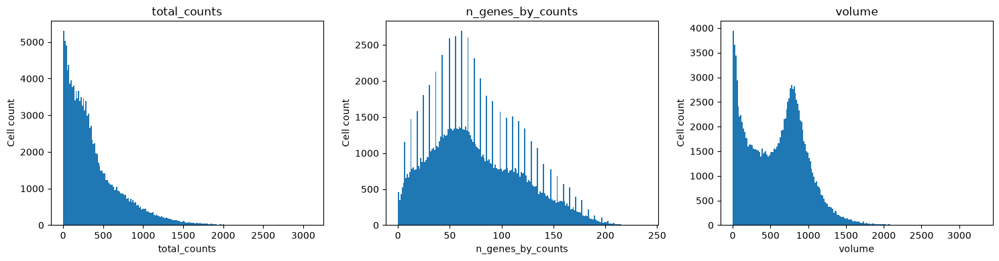

In [23]:
import matplotlib.pyplot as plt

cols = [
    "total_counts",
    "n_genes_by_counts",
    "volume"]

print(adata.obs[cols].describe(percentiles=[
    0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99
]))


fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, col in zip(axes, cols):
    ax.hist(
        adata.obs[col],
        bins=200
    )
    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel("Cell count")

plt.tight_layout()
plt.show()

Removed cells: 3159
Remaining cells: 136456


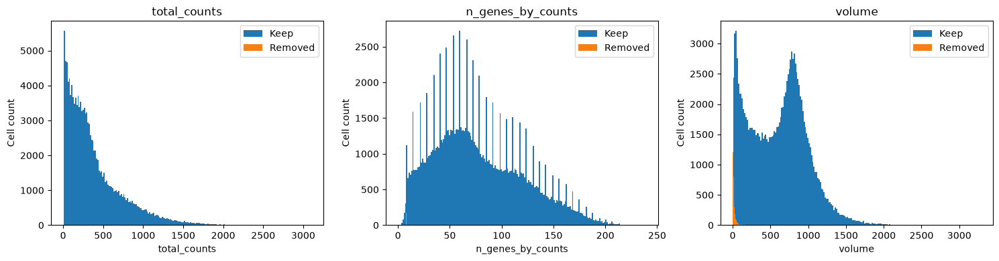

In [25]:
import matplotlib.pyplot as plt

cols = [
    "total_counts",
    "n_genes_by_counts",
    "volume"
]

remove_mask = adata.obs["total_counts"] < 10

print("Removed cells:", remove_mask.sum())
print("Remaining cells:", (~remove_mask).sum())


fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, col in zip(axes, cols):

    ax.hist(
        adata.obs.loc[~remove_mask, col],
        bins=200,
        label="Keep"
    )

    ax.hist(
        adata.obs.loc[remove_mask, col],
        bins=200,
        label="Removed"
    )

    ax.set_title(col)
    ax.set_xlabel(col)
    ax.set_ylabel("Cell count")
    ax.legend()

plt.tight_layout()
plt.show()

In [26]:
adata = adata[~remove_mask].copy()

# Demension Reduction

In [27]:
adata.layers['RNA'] = adata.X.copy()

In [28]:
sc.pp.normalize_total(
    adata,
    target_sum=10000)

In [29]:
sc.pp.log1p(adata)

In [30]:
sc.pp.scale(
    adata,
    max_value=10)

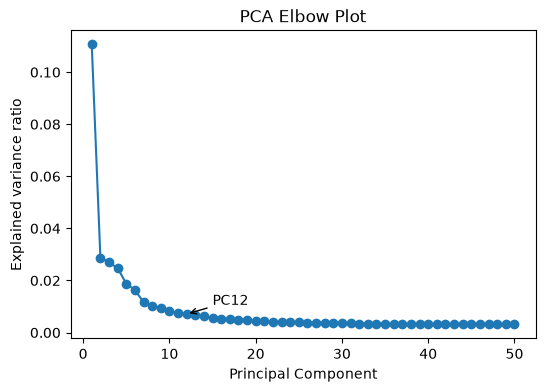

In [31]:
sc.tl.pca(
    adata,
    n_comps=50)

var_ratio = adata.uns["pca"]["variance_ratio"]

plt.figure(figsize=(6,4))

plt.plot(
    range(1, len(var_ratio)+1),
    var_ratio,
    marker="o"
)

plt.annotate(
    "PC12",
    xy=(12, var_ratio[11]),
    xytext=(15, var_ratio[11]*1.5),
    arrowprops=dict(
        arrowstyle="->"
    )
)

plt.xlabel("Principal Component")
plt.ylabel("Explained variance ratio")
plt.title("PCA Elbow Plot")

plt.show()

In [32]:
sc.tl.pca( adata, n_comps=12)

In [33]:
sc.pp.neighbors(
    adata,
    n_neighbors=15,
    n_pcs=12)

2026-07-22 06:39:39.613708: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1784669979.625857 4056161 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1784669979.630007 4056161 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1784669979.640263 4056161 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1784669979.640277 4056161 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1784669979.640279 4056161 computation_placer.cc:177] computation placer alr

In [50]:
adata.write_h5ad(
    "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/merged_after_lognorm.h5ad",compression="gzip")

In [39]:
###################################################################
###################### UMAP BENCHMARK #############################
###################################################################

In [1]:
import scanpy as sc

adata = sc.read_h5ad('/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/merged_after_lognorm.h5ad')

In [4]:
import scvi 
from scvi.model import SCVI

scvi.model.SCVI.setup_anndata(adata, layer="RNA", batch_key="sample_id")
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=30, gene_likelihood="nb")

vae.train(max_epochs=400, early_stopping=True, early_stopping_patience=10)

ModuleNotFoundError: No module named 'yaml'

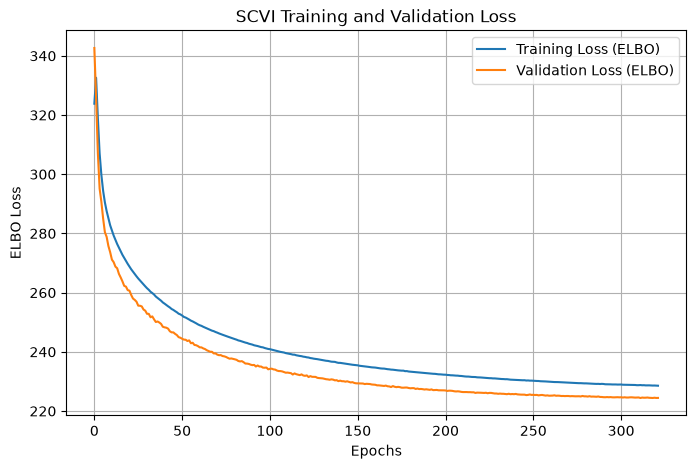

In [40]:
import matplotlib.pyplot as plt

train_loss = vae.history["elbo_train"]
val_loss = vae.history["elbo_validation"]
plt.figure(figsize=(8, 5))
plt.plot(train_loss, label="Training Loss (ELBO)")
plt.plot(val_loss, label="Validation Loss (ELBO)")
plt.xlabel("Epochs")
plt.ylabel("ELBO Loss")
plt.title("SCVI Training and Validation Loss")
plt.legend()
plt.grid()
plt.show()

Text(0.5, 1.0, 'scVI')

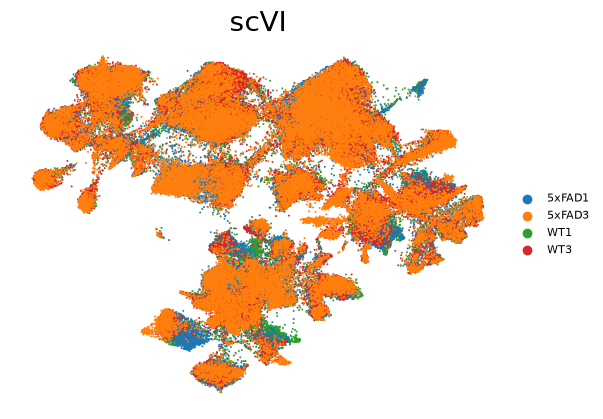

In [42]:
adata.obsm["X_scVI"] = vae.get_latent_representation()
sc.pp.neighbors(adata, use_rep = 'X_scVI')
sc.tl.umap(adata)
sc.pl.umap(
    adata,
    color=['sample_id'],
    frameon=False,
    size= 8,
    legend_fontsize=8,
    legend_fontoutline=3,
    title="Sample",
    show=False)

plt.title("scVI", fontsize=20)

In [2]:
import scanpy.external as sce

adata_bbknn = adata.copy()

sc.pp.pca(
    adata_bbknn,
    n_comps=12)

sce.pp.bbknn(
    adata_bbknn,
    batch_key="sample_id",
    neighbors_within_batch=5,
    n_pcs=12)

sc.tl.umap(
    adata_bbknn)

sc.tl.leiden(
    adata_bbknn,
    resolution=1)

/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2026-07-22 16:45:04.404654: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1784706304.419256  313141 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1784706304.424162  313141 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1784706304.435973  313141 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same

/tmp/ipykernel_313141/4002197801.py:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


In [3]:
import harmonypy as hm

adata_harmony = adata.copy()

sc.pp.pca(
    adata_harmony,
    n_comps=12)


ho = hm.run_harmony(
    adata_harmony.obsm["X_pca"],
    adata_harmony.obs, "sample_id")

adata_harmony.obsm["X_harmony"] = ho.Z_corr

sc.pp.neighbors(
    adata_harmony,
    use_rep="X_harmony",
    n_neighbors=15)

sc.tl.umap(adata_harmony)

sc.tl.leiden(
    adata_harmony,
    resolution=1)

2026-07-22 16:51:57,341 - harmonypy - INFO - Running Harmony
2026-07-22 16:51:57,344 - harmonypy - INFO -   Parameters:
2026-07-22 16:51:57,345 - harmonypy - INFO -     max_iter_harmony: 10
2026-07-22 16:51:57,346 - harmonypy - INFO -     max_iter_kmeans: 4
2026-07-22 16:51:57,346 - harmonypy - INFO -     epsilon_cluster: 0.001
2026-07-22 16:51:57,347 - harmonypy - INFO -     epsilon_harmony: 0.01
2026-07-22 16:51:57,347 - harmonypy - INFO -     nclust: 100
2026-07-22 16:51:57,348 - harmonypy - INFO -     block_size: 0.05
2026-07-22 16:51:57,348 - harmonypy - INFO -     lamb: dynamic (alpha=0.2)
2026-07-22 16:51:57,349 - harmonypy - INFO -     theta: [2. 2. 2. 2.]
2026-07-22 16:51:57,350 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-07-22 16:51:57,350 - harmonypy - INFO -     verbose: True
2026-07-22 16:51:57,351 - harmonypy - INFO -     random_state: 0
2026-07-22 16:51:57,351 - harmonypy - INFO -   Data: 12 PCs × 136456 cells
2026-07-22 16:51:57,352 - harmonypy - INFO 

In [12]:
from scib_metrics.benchmark import Benchmarker

adata.obsm["X_scVI"] = adata.obsm["X_scVI"]
adata_harmony.obsm["X_harmony"] = adata_harmony.obsm["X_harmony"]
adata_bbknn.obsm["X_bbknn"] = adata_bbknn.obsm["X_pca"]

adata_bench = adata.copy()
adata_bench.obsm["X_scVI"] = adata.obsm["X_scVI"]
adata_bench.obsm["X_harmony"] = adata_harmony.obsm["X_harmony"]
adata_bench.obsm["X_bbknn"] = adata_bbknn.obsm["X_pca"]

sc.pp.neighbors(
    adata_bench,
    use_rep="X_scVI",
    key_added="neighbors_scVI")

sc.pp.neighbors(
    adata_bench,
    use_rep="X_harmony",
    key_added="neighbors_harmony")

sc.pp.neighbors(
    adata_bench,
    use_rep="X_bbknn",
    key_added="neighbors_bbknn")

In [17]:
from scib_metrics.benchmark import Benchmarker

sc.pp.neighbors(
    adata_bench,
    use_rep="X_scVI")

sc.tl.leiden(
    adata_bench,
    key_added="leiden_scvi")

adata_bench.obs["leiden"] = adata_bench.obs["leiden_scvi"]

bm = Benchmarker(
    adata_bench,
    batch_key="sample_id",
    label_key="leiden",
    embedding_obsm_keys=[
        "X_scVI",
        "X_harmony",
        "X_bbknn"])

In [19]:
bm.benchmark()

/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
rics:   0%|          | 0/10 [00:00<?, ?it/s]

Embeddings:  33%|███▎      | 1/3 [06:28<12:56, 388.46s/it]tch correction: pcr_comparison]
                                                                                      
Embeddings:  67%|██████▋   | 2/3 [11:27<05:35, 335.62s/it]tch correction: pcr_comparison]
                                                                                      
rics:  80%|████████  | 8/10 [04:14<01:02, 31.44s/it, Batch correction: graph_connectivity]
/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/python3.11/site-packages/scib_metrics/metrics/_pcr

In [20]:
results = bm.get_results()
results

,Isolated labels,KMeans NMI,KMeans ARI,Silhouette label,cLISI,BRAS,iLISI,KBET,Graph connectivity,PCR comparison,Batch correction,Bio conservation,Total
Embedding,,,,,,,,,,,,,
X_scVI,0.779665,0.779394,0.581098,0.573751,0.999917,0.902231,0.535799,0.333416,0.958356,0.743525,0.694665,0.742765,0.723525
X_harmony,0.63665,0.603815,0.334474,0.52198,0.986039,0.915848,0.644821,0.574327,0.85965,0.883808,0.775691,0.616591,0.680231
X_bbknn,0.635468,0.580681,0.308551,0.518837,0.986819,0.781678,0.326442,0.201764,0.873073,0,0.436591,0.606071,0.538279
Metric Type,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Bio conservation,Batch correction,Batch correction,Batch correction,Batch correction,Batch correction,Aggregate score,Aggregate score,Aggregate score


In [36]:
import pandas as pd

plot_df = results.loc[
    ["X_scVI", "X_harmony", "X_bbknn"],
    [
        "Isolated labels",
        "Silhouette label",
        "Graph connectivity",
        "Bio conservation",
        "Total"
    ]
].astype(float)


def gradient_bar(val):
    pct = val * 100
    alpha = 0.2 + 0.8 * val
    
    return (
        f"background: linear-gradient("
        f"90deg,"
        f"rgba(255,0,0,{alpha}) 0%,"
        f"rgba(255,0,0,{alpha}) {pct}%,"
        f"white {pct}%,"
        f"white 100%);"
        f"border:1px solid black;"
    )


plot_df.style.map(
    gradient_bar
)

,Isolated labels,Silhouette label,Graph connectivity,Bio conservation,Total
Embedding,,,,,
X_scVI,0.779665,0.573751,0.958356,0.742765,0.723525
X_harmony,0.636650,0.521980,0.859650,0.616591,0.680231
X_bbknn,0.635468,0.518837,0.873073,0.606071,0.538279


# Clustering

In [3]:
###################################################################
###################### Label transfer #############################
###################################################################

In [65]:
import scanpy as sc

adata = sc.read_h5ad('/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/merged_after_lognorm.h5ad')

In [72]:
import scanpy as sc
import pandas as pd
import os

base="/home/Data_Drive_8TB_2/kykim/potrai/Label_transfer"

adata_ref=sc.read_h5ad(os.path.join(base,"WMB-10Xv3-HPF-raw.h5ad"))

cell_metadata=pd.read_csv(os.path.join(base,"cell_metadata.csv"),index_col=0)
cluster_metadata=pd.read_csv(os.path.join(base,"cell_metadata_with_cluster_annotation.csv"),index_col=0)
gene_metadata=pd.read_csv(os.path.join(base,"gene.csv"),index_col=0)

cell_metadata=cell_metadata.reindex(adata_ref.obs_names)
cluster_metadata=cluster_metadata.reindex(adata_ref.obs_names)

new_obs=pd.concat([cell_metadata,cluster_metadata],axis=1)
new_obs=new_obs.loc[:,~new_obs.columns.duplicated()]
new_obs=new_obs.drop(columns=adata_ref.obs.columns.intersection(new_obs.columns))

adata_ref.obs=pd.concat([adata_ref.obs,new_obs],axis=1)

gene_metadata=gene_metadata.reindex(adata_ref.var_names)
gene_metadata=gene_metadata.loc[:,~gene_metadata.columns.duplicated()]
gene_metadata=gene_metadata.drop(columns=adata_ref.var.columns.intersection(gene_metadata.columns))

adata_ref.var=pd.concat([adata_ref.var,gene_metadata],axis=1)

adata_ref.var["ensembl_id"]=adata_ref.var.index
adata_ref.var_names=adata_ref.var["gene_symbol"].astype(str)
adata_ref.var_names.name=None

keep_gene=~adata_ref.var_names.duplicated()
adata_ref=adata_ref[:,keep_gene].copy()

adata_ref.obs=adata_ref.obs.loc[:,~adata_ref.obs.columns.duplicated()]
adata_ref.var=adata_ref.var.loc[:,~adata_ref.var.columns.duplicated()]

adata_ref.var_names_make_unique()

/tmp/ipykernel_55859/2586604715.py:10: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  cluster_metadata=pd.read_csv(os.path.join(base,"cell_metadata_with_cluster_annotation.csv"),index_col=0)


In [75]:
adata_ref.write_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/Label_transfer/HPF_sort.h5ad")

In [85]:
import scanpy as sc

adata_ref = sc.read_h5ad('/home/Data_Drive_8TB_2/kykim/potrai/Label_transfer/HPF_sort.h5ad')

In [86]:
adata.X = adata.layers['RNA'].copy()

In [87]:
import scanpy as sc
import scvi

common_genes = adata.var_names.intersection(adata_ref.var_names)

adata = adata[:, common_genes].copy()
adata_ref = adata_ref[:, common_genes].copy()

adata.obs["batch"] = adata.obs["sample_id"].astype(str)
adata_ref.obs["batch"] = adata_ref.obs["library_label"].astype(str)

adata.obs["dataset"] = "MERSCOPE"
adata_ref.obs["dataset"] = "Allen"

adata_all = adata_ref.concatenate(
    adata,
    batch_key="source")

scvi.model.SCVI.setup_anndata(
    adata_all,
    batch_key="batch")

model = scvi.model.SCVI(
    adata_all,
    n_latent=30)

model.train()

adata_all.obsm["X_scVI"] = model.get_latent_representation()

/tmp/ipykernel_55859/562983363.py:15: FutureWarning: The method concatenate is deprecated and will be removed in the future. Use anndata.concat instead of AnnData.concatenate. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_all = adata_ref.concatenate(
Trainer will use only 1 of 2 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=2)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1]
/home/Data_Drive_8TB/kykim/.conda/envs/stardist-env/lib/pytho

Epoch 25/25: 100%|██████████| 25/25 [09:39<00:00, 22.73s/it, v_num=1, train_loss=213]

`Trainer.fit` stopped: `max_epochs=25` reached.


Epoch 25/25: 100%|██████████| 25/25 [09:39<00:00, 23.18s/it, v_num=1, train_loss=213]


In [88]:
ref_idx = adata_all.obs["dataset"]=="Allen"
query_idx = adata_all.obs["dataset"]=="MERSCOPE"

adata_ref_scvi = adata_all[ref_idx].copy()
adata_query_scvi = adata_all[query_idx].copy()

X_ref = adata_ref_scvi.obsm["X_scVI"]
X_query = adata_query_scvi.obsm["X_scVI"]

In [90]:
from sklearn.neighbors import KNeighborsClassifier
import pandas as pd

labels = [
    "class",
    "subclass",
    "supertype",
    "cluster"
]

result = pd.DataFrame(index=adata_query_scvi.obs_names.str.replace("-1$", "", regex=True))

for label in labels:
    clf = KNeighborsClassifier(
        n_neighbors=20,
        weights="distance"
    )

    clf.fit(
        X_ref,
        adata_ref_scvi.obs[label]
    )

    prob = clf.predict_proba(X_query)

    result[label+"_pred"] = clf.classes_[prob.argmax(axis=1)]
    result[label+"_score"] = prob.max(axis=1)

adata.obs = adata.obs.drop(
    columns=result.columns,
    errors="ignore"
).join(result)

In [97]:
for col in [
    "class_pred",
    "subclass_pred",
    "supertype_pred",
    "cluster_pred"]:
    
    print("\n", col)
    print(adata.obs[col].value_counts())


 class_pred
class_pred
29 Oligo             33089
28 Astro-Epen        28597
01 IT-ET Glut        25139
31 Vascular          17814
32 Immune            11293
02 NP-CT-L6b Glut     6704
05 MGE GABA           5028
03 MOB-DG-IMN         4854
04 CGE GABA           3288
06 CNU GABA            341
12 MOB-CR Glut         270
20 MB GABA              36
14 CNU-HYa GABA          3
Name: count, dtype: int64

 subclass_pred
subclass_pred
295 Oligo NN                   28752
287 Astro-TE NN                27197
301 Endo NN                    12398
302 Microglia NN               10326
019 L2/3 IT PPP Glut            6381
                               ...  
289 Astroependymal NN              3
250 SNc-VTA-RAmb Foxa1 Dopa        1
025 L6b EPd Glut                   1
304 Monocytes NN                   1
013 COAp Grxcr2 Glut               1
Name: count, Length: 62, dtype: int64

 supertype_pred
supertype_pred
1027 MOL NN                        28672
1007 Astro-TE NN_3                 26267
1037 Endo 

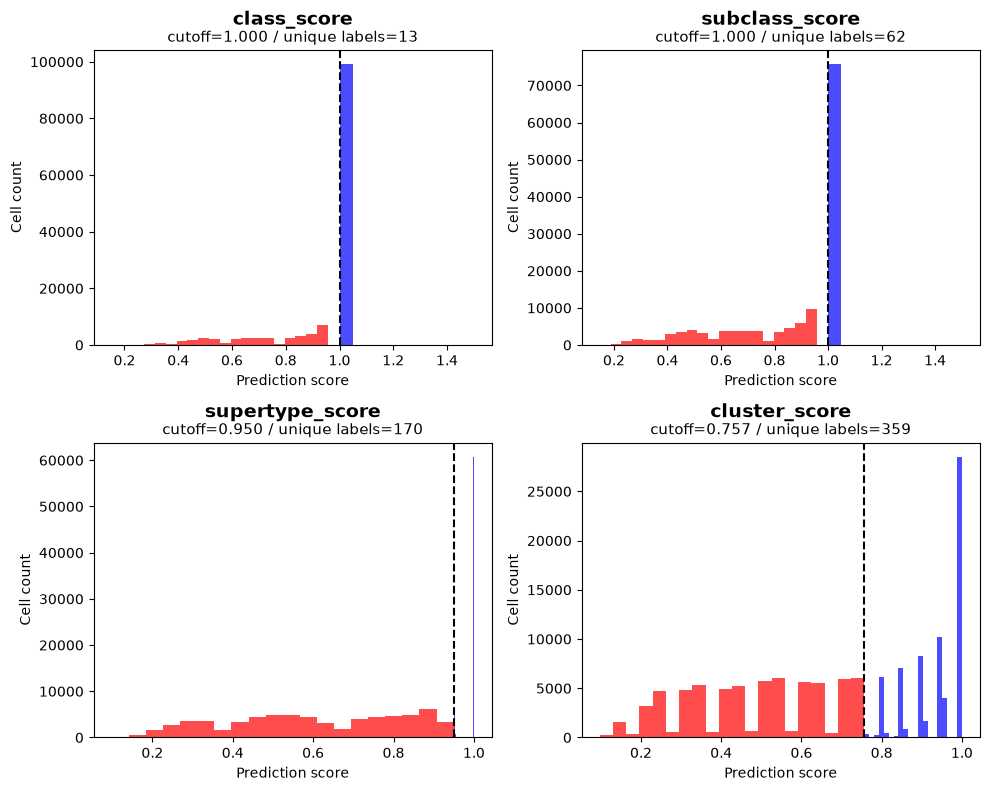

{'class_score': np.float64(1.0),
 'subclass_score': np.float64(1.0),
 'supertype_score': np.float64(0.9497134524843618),
 'cluster_score': np.float64(0.7566403975094327)}

In [124]:
import matplotlib.pyplot as plt

scores = [
    "class_score",
    "subclass_score",
    "supertype_score",
    "cluster_score"
]

cutoffs = {}

fig, axes = plt.subplots(
    2, 2,
    figsize=(10, 8)
)

axes = axes.flatten()

for ax, score in zip(axes, scores):

    x = adata.obs[score].dropna()

    cutoff = x.quantile(0.50)
    cutoffs[score] = cutoff

    pred_col = score.replace("_score", "_pred")
    unique_count = adata.obs[pred_col].nunique()

    ax.hist(
        x[x < cutoff],
        bins=20,
        color="red",
        alpha=0.7
    )

    ax.hist(
        x[x >= cutoff],
        bins=20,
        color="blue",
        alpha=0.7
    )

    ax.axvline(
        cutoff,
        linestyle="--",
        color="black"
    )

    ax.set_title(
    f"cutoff={cutoff:.3f} / unique labels={unique_count}",
    fontsize=11
)

    ax.text(
    0.5,
    1.07,
    score,
    transform=ax.transAxes,
    ha="center",
    va="bottom",
    fontsize=14,
    fontweight="bold"
)

    ax.set_xlabel("Prediction score")
    ax.set_ylabel("Cell count")

plt.tight_layout()
plt.show()

cutoffs

In [127]:
adata.obs['final_label_transfer'] = adata.obs['class_pred'].where(adata.obs['class_score'] == 1, 'unpredicted')

<Axes: title={'center': 'final_label_transfer'}, xlabel='UMAP1', ylabel='UMAP2'>

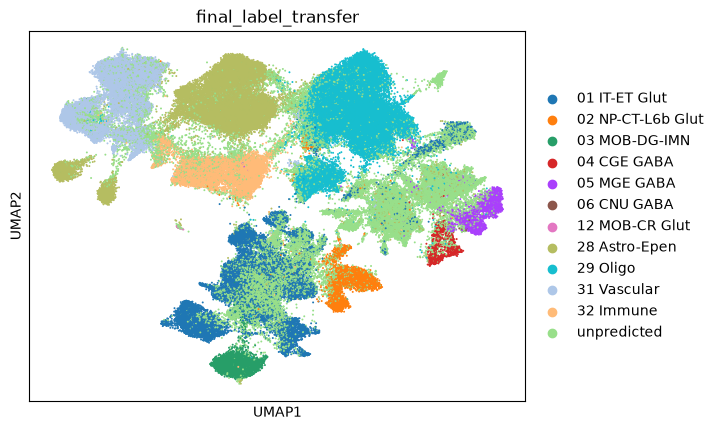

In [133]:
sc.pl.umap(
    adata,
    color=['final_label_transfer'],
    size= 8,
    show=False)

In [12]:
adata.write_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer.h5ad")

In [135]:
###################################################################
#################### Manual annotation ############################
###################################################################

In [16]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer.h5ad")

In [17]:
for res in [0.10, 0.25, 0.50]:
    sc.tl.leiden(adata, key_added=f"leiden_res_{res:4.2f}", resolution=res, flavor="igraph")

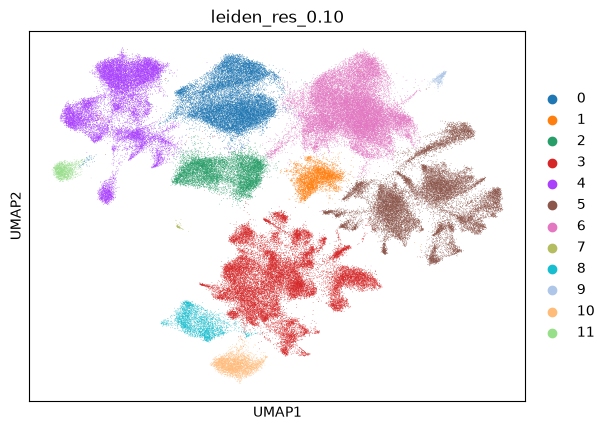

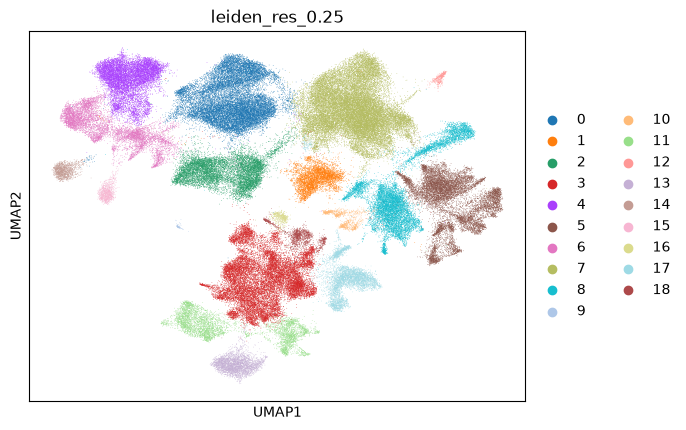

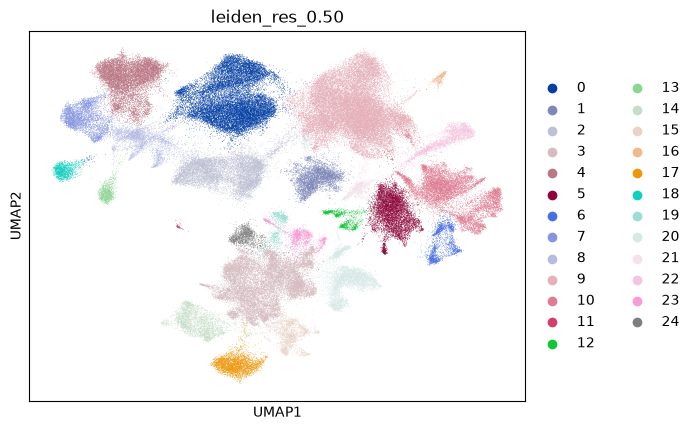

In [18]:
sc.pl.umap(adata, color=["leiden_res_0.10"])
sc.pl.umap(adata, color=["leiden_res_0.25"])
sc.pl.umap(adata, color=["leiden_res_0.50"])

In [21]:
sc.pp.normalize_total(adata,target_sum=1e4) 
sc.pp.log1p(adata)

Cluster 0: ['Bcan', 'Apoe', 'Clu', 'Grin2c', 'Aqp4', 'Aldh1l1', 'Id4', 'Ntrk2', 'C4b', 'Rorb', 'Cspg5', 'Pdgfrb', 'Pax6', 'Camk2g', 'Mmp14', 'Gfap', 'Itga7', 'Vcam1', 'Celsr1', 'Wfs1']
Cluster 1: ['Olig1', 'Pdgfra', 'Cspg4', 'Sox10', 'Bcan', 'Cspg5', 'Sulf2', 'Sema5b', 'Sox8', 'Grin3a', 'Elfn1', 'Nnat', 'Apoe', 'Acan', 'Kcnd2', 'S100b', 'Trib2', 'Ntrk2', 'Src', 'Neto1']
Cluster 2: ['C1qa', 'Csf1r', 'Trem2', 'Ctss', 'Inpp5d', 'Abi3', 'Tmem119', 'Plcg2', 'Prkcd', 'Siglech', 'Spi1', 'P2ry12', 'Apoe', 'Icam1', 'Mrc2', 'Ly9', 'Cbln4', 'Casp8', 'Itgax', 'Cst7']
Cluster 3: ['Slc17a7', 'Slc30a3', 'Nptxr', 'Grin1', 'Camk2a', 'Ptk2b', 'Syp', 'Nptx1', 'Cx3cl1', 'Grin2a', 'Cckbr', 'Cck', 'Chrm4', 'Grin2b', 'Syngap1', 'Syn1', 'Gria2', 'Nrg3', 'Gpr158', 'Gria3']
Cluster 4: ['Cldn5', 'Flt1', 'Fn1', 'Nos3', 'Tek', 'Apoe', 'App', 'Ctnnb1', 'Ndnf', 'Cd2ap', 'Zbtb20', 'Fmo1', 'Erbb2', 'Casp8', 'Kcnq1', 'Icam1', 'Trib2', 'Clu', 'Abi3', 'Inpp5d']
Cluster 5: ['Slc32a1', 'Gad1', 'Gad2', 'Kcnc1', 'Syp', 'Grin

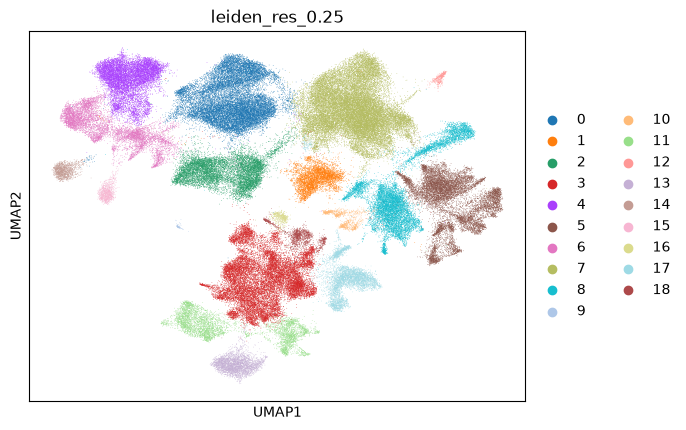

In [27]:
import scanpy as sc
adata.obs['leiden_res_0.25'] = adata.obs['leiden_res_0.25'].astype('category')
sc.tl.rank_genes_groups(adata, groupby='leiden_res_0.25', method='t-test')

top_genes = {}

groups = adata.uns['rank_genes_groups']['names'].dtype.names

for group in groups:
    genes = adata.uns['rank_genes_groups']['names'][group][:20]
    top_genes[group] = genes.tolist()

for cluster, genes in top_genes.items():
    print(f"Cluster {cluster}: {genes}")
    
sc.pl.umap(
    adata,
    color='leiden_res_0.25')

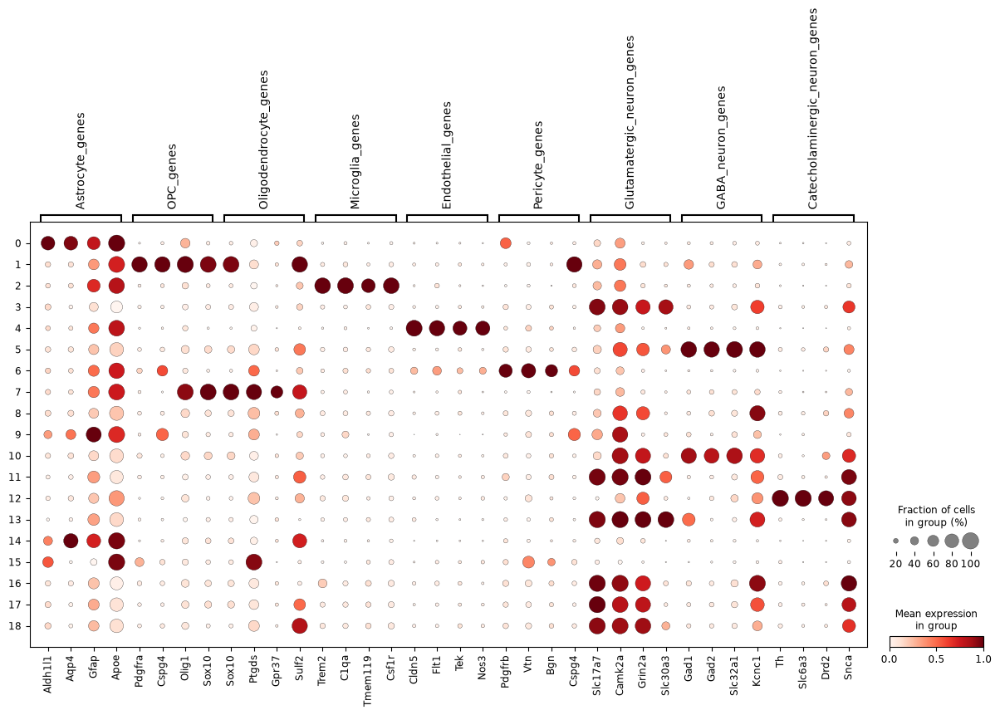

In [33]:
import scanpy as sc

group_markers = {
    "Astrocyte_genes": ['Aldh1l1','Aqp4','Gfap','Apoe'],
    "OPC_genes": ['Pdgfra','Cspg4','Olig1','Sox10'],
    "Oligodendrocyte_genes": ['Sox10','Ptgds','Gpr37','Sulf2'],
    "Microglia_genes": ['Trem2','C1qa','Tmem119','Csf1r'],
    "Endothelial_genes": ['Cldn5','Flt1','Tek','Nos3'],
    "Pericyte_genes": ['Pdgfrb','Vtn','Bgn','Cspg4'],
    "Glutamatergic_neuron_genes": ['Slc17a7','Camk2a','Grin2a','Slc30a3'],
    "GABA_neuron_genes": ['Gad1','Gad2','Slc32a1','Kcnc1'],
    "Catecholaminergic_neuron_genes": ['Th','Slc6a3','Drd2','Snca']}

existing_genes = {cat:[gene for gene in genes if gene in adata.var_names] for cat, genes in group_markers.items()}
existing_genes = {cat:genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(adata, var_names=existing_genes, groupby="leiden_res_0.25", standard_scale="var")

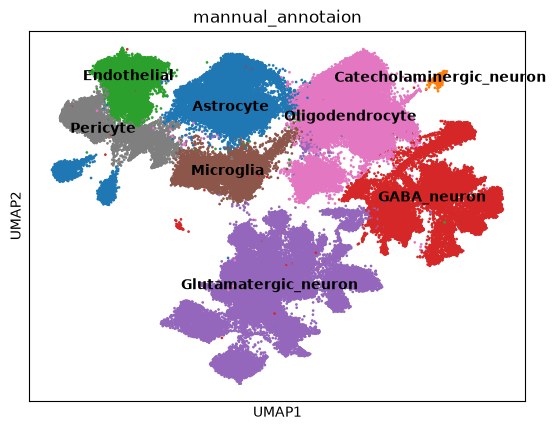

In [45]:
cluster_to_group = {
    0: "Astrocyte",
    1: "Oligodendrocyte",
    2: "Microglia",
    3: "Glutamatergic_neuron",
    4: "Endothelial",
    5: "GABA_neuron",
    6: "Pericyte",
    7: "Oligodendrocyte",
    8: "GABA_neuron",
    9: "GABA_neuron",
    10: "Glutamatergic_neuron",
    11: "Glutamatergic_neuron",
    12: "Catecholaminergic_neuron",
    13: "Glutamatergic_neuron",
    14: "Astrocyte",
    15: "Astrocyte",
    16: "Glutamatergic_neuron",
    17: "Glutamatergic_neuron",
    18: "Glutamatergic_neuron"}


adata.obs["mannual_annotaion"] = adata.obs["leiden_res_0.25"].astype(int).map(cluster_to_group)
sc.pl.umap(
    adata,
    color='mannual_annotaion',
    legend_loc='on data'
    , s = 15
)

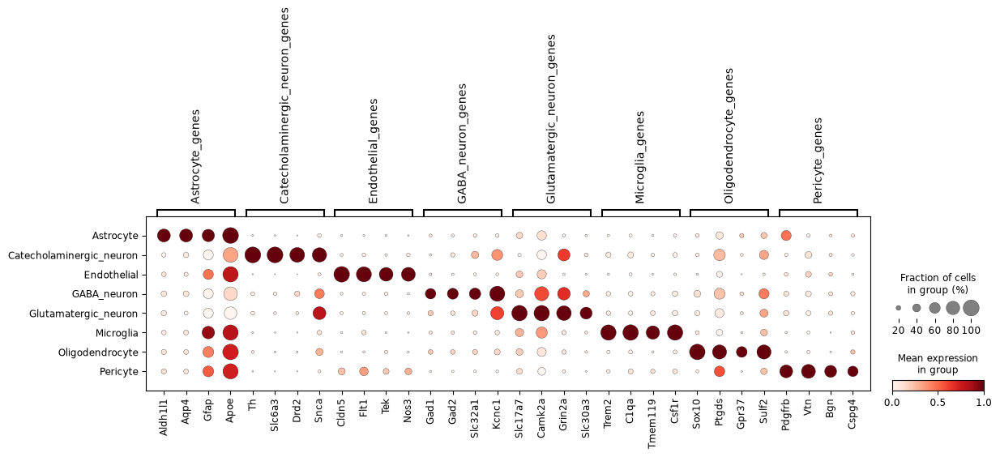

In [48]:
import scanpy as sc

group_markers = {
    "Astrocyte_genes": ['Aldh1l1','Aqp4','Gfap','Apoe'],
    "Catecholaminergic_neuron_genes": ['Th','Slc6a3','Drd2','Snca'],
    "Endothelial_genes": ['Cldn5','Flt1','Tek','Nos3'],
    "GABA_neuron_genes": ['Gad1','Gad2','Slc32a1','Kcnc1'],
    "Glutamatergic_neuron_genes": ['Slc17a7','Camk2a','Grin2a','Slc30a3'],
    "Microglia_genes": ['Trem2','C1qa','Tmem119','Csf1r'],
    "Oligodendrocyte_genes": ['Sox10','Ptgds','Gpr37','Sulf2'],
    "Pericyte_genes": ['Pdgfrb','Vtn','Bgn','Cspg4']  
}

existing_genes = {cat: [gene for gene in genes if gene in adata.var_names] 
                  for cat, genes in group_markers.items()}
existing_genes = {cat: genes for cat, genes in existing_genes.items() if genes}

sc.pl.dotplot(adata, var_names=existing_genes, groupby="mannual_annotaion", standard_scale="var")

In [49]:
adata.write_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_manual.h5ad")

In [221]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_manual.h5ad")

The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.


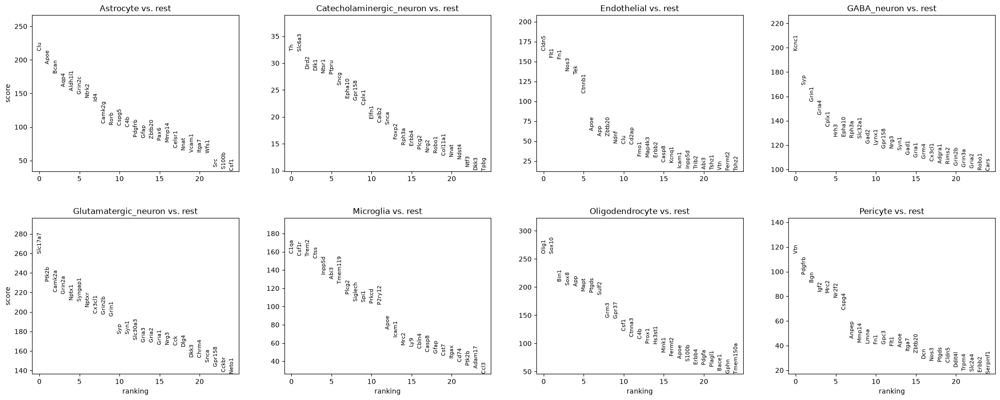

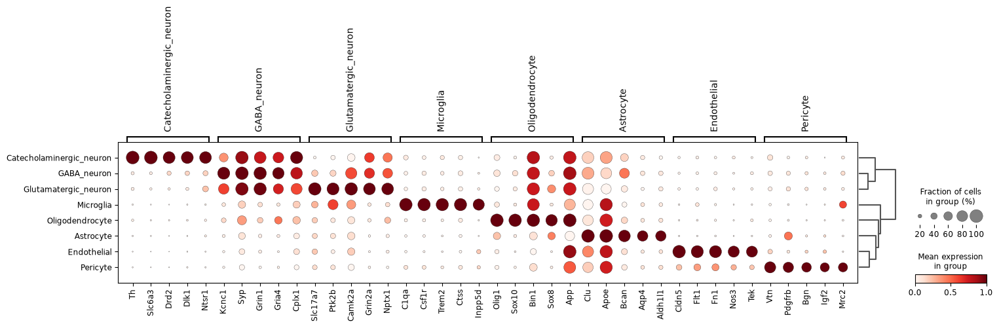

In [18]:
sc.tl.rank_genes_groups(adata, 'mannual_annotaion', method="wilcoxon",use_raw =False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
sc.tl.dendrogram(adata, groupby='mannual_annotaion')
sc.pl.rank_genes_groups_dotplot(adata, groupby="mannual_annotaion", standard_scale="var",  n_genes=5, use_raw=False)

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names 
result_df = pd.DataFrame({
        f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]})

up_dict = {}
down_dict = {}

for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"

    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)

df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())
df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())
sc.tl.dendrogram(adata, groupby='mannual_annotaion')

In [19]:
import pandas as pd
import scanpy as sc

result = adata.uns["rank_genes_groups"]
groups = result["names"].dtype.names
result_df = pd.DataFrame(
    {f"{group}_{key}": result[key][group]
        for group in groups
        for key in ["names", "pvals_adj", "logfoldchanges", "scores"]})
up_dict = {}
down_dict = {}
for group in groups:
    n_col = f"{group}_names"
    p_col = f"{group}_pvals_adj"
    l_col = f"{group}_logfoldchanges"
    s_col = f"{group}_scores"
    degs_sig = result_df[result_df[p_col] < 0.05]
    degs_up = degs_sig[degs_sig[l_col] > 1].sort_values(by=s_col, ascending=False)
    degs_dw = degs_sig[degs_sig[l_col] < -1].sort_values(by=s_col, ascending=True)
    up_dict[group] = degs_up[n_col].reset_index(drop=True)
    down_dict[group] = degs_dw[n_col].reset_index(drop=True)
df_merge_up = pd.concat(up_dict.values(), axis=1)
df_merge_up.columns = list(up_dict.keys())  # 각 열 이름을 group 이름으로
df_merge_down = pd.concat(down_dict.values(), axis=1)
df_merge_down.columns = list(down_dict.keys())

In [20]:
import sys
sys.path.append("/home/Data_Drive_8TB/kykim/QED")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from qed.data import get_enrichment_dataframes, merge_df


class GeneSet:
    def __init__(self, genes, name, annot=None):
        self.genes = genes
        self.name = name
        self.params = {}
        self.GO = []
        self.annot = annot or {}


dblist = ['CellMarker_2024','CellMarker_Augmented_2021','PanglaoDB_Augmented_2021']

df_merge_up_100 = df_merge_up.head(20)
df_merge_up_100.to_csv('breast_cancer_DEG_up_leiden.csv', index=False)

alist = pd.read_csv('breast_cancer_DEG_up_leiden.csv')

geneset_list = [
    GeneSet(
        genes=alist[col].dropna().tolist(),
        name=col,
        annot={"Leiden": col})
    for col in alist.columns]

aalist = get_enrichment_dataframes(
    geneset_list=geneset_list,
    dblist=dblist,
    annot_colname="mannual_annotaion",
    handle_error=True,
    max_iter=1)

df = merge_df(aalist)

df['Term'] = (
    df['Term']
    .str.split(r'\(GO:').str[0]
    .str.split('R-H').str[0]
    .str.split('WP').str[0]
    .str.strip())

Processing genesets:  12%|█▎        | 1/8 [00:00<00:04,  1.51it/s]

Error processing Astrocyte for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Endothelial for CellMarker_2024: Error analyzing gene list
Error processing Catecholaminergic_neuron for CellMarker_Augmented_2021: Error analyzing gene list
Error processing GABA_neuron for CellMarker_2024: Error analyzing gene list
Error processing Endothelial for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Glutamatergic_neuron for PanglaoDB_Augmented_2021: Error analyzing gene list
Error processing Glutamatergic_neuron for CellMarker_Augmented_2021: Error analyzing gene list
Error processing GABA_neuron for CellMarker_Augmented_2021: Error analyzing gene list
Error processing Endothelial for PanglaoDB_Augmented_2021: Error analyzing gene list
Error processing Pericyte for CellMarker_2024: Error analyzing gene list
Error processing GABA_neuron for PanglaoDB_Augmented_2021: Error analyzing gene list
Error processing Microglia for PanglaoDB_Augmented_2021: Erro

Processing genesets: 24it [00:01, 12.54it/s]                      


Trying to re-request...
Astrocyte with CellMarker_Augmented_2021 completed!
Catecholaminergic_neuron with CellMarker_Augmented_2021 completed!
Endothelial with CellMarker_2024 completed!
Endothelial with CellMarker_Augmented_2021 completed!
Endothelial with PanglaoDB_Augmented_2021 completed!
GABA_neuron with CellMarker_2024 completed!
GABA_neuron with CellMarker_Augmented_2021 completed!
GABA_neuron with PanglaoDB_Augmented_2021 completed!
Glutamatergic_neuron with CellMarker_2024 completed!
Glutamatergic_neuron with CellMarker_Augmented_2021 completed!
Glutamatergic_neuron with PanglaoDB_Augmented_2021 completed!
Microglia with CellMarker_2024 completed!
Microglia with PanglaoDB_Augmented_2021 completed!
Oligodendrocyte with CellMarker_2024 completed!
Oligodendrocyte with CellMarker_Augmented_2021 completed!
Oligodendrocyte with PanglaoDB_Augmented_2021 completed!
Pericyte with CellMarker_2024 completed!
Pericyte with CellMarker_Augmented_2021 completed!
Pericyte with PanglaoDB_Augme

In [33]:
from typing import Dict, Tuple

def heatmap_with_groupwise_ordering(df: pd.DataFrame,
                                     n: int,
                                     group_by: str,
                                     order_by: str = "Adjusted p-value",
                                     cmap: str = 'Blues',
                                     xlabel_rotation: int = 90,
                                     xlabel_fontsize: int = 15,
                                     ylabel_fontsize: int = 15,
                                     figsize: Tuple = (15, 10),
                                     vmin: float = None,
                                     vmax: float = None,
                                     cbar_kws: Dict = None,
                                     linewidths: float = 0.1,
                                     title: str = None,
                                     save_to_file: str = None,
                                     enable_column_order: bool = False,
                                     column_order: list = None,
                                     enable_highlight_columns: bool = False,
                                     highlight_column_names: list = None):
    
    df = df.copy()
    df[order_by] = pd.to_numeric(df[order_by], errors="coerce")
    df = df.dropna(subset=[order_by])

    df["Term_lower"] = df["Term"].str.lower()

    selected = (
        df.sort_values(order_by)
        .groupby(group_by)
        .head(n))

    terms = selected["Term_lower"].unique()

    plot_df = (
        df[df["Term_lower"].isin(terms)]
        .groupby(["Term_lower", group_by])[order_by]
        .min()
        .reset_index()
        .pivot(index="Term_lower", columns=group_by, values=order_by)
        .fillna(1))

    plot_df = -np.log10(plot_df)

    plot_df.index = plot_df.index.str.capitalize()

    rows = []
    for group in column_order if column_order else df[group_by].unique():
        group_terms = selected[selected[group_by]==group]["Term_lower"]
        rows.extend(
            [x.capitalize() for x in group_terms if x.capitalize() in plot_df.index])

    rows = list(dict.fromkeys(rows))
    plot_df = plot_df.loc[rows]

    if column_order:
        cols = [x for x in column_order if x in plot_df.columns]
        plot_df = plot_df[cols]

    if save_to_file:
        plot_df.to_csv(save_to_file, encoding="utf-8-sig")

    fig, ax = plt.subplots(figsize=figsize)

    sns.heatmap(
        plot_df,
        cmap=cmap,
        linewidths=0.1,
        square=True,
        annot=np.where(10**(-plot_df)<=0.05,"*",""),
        fmt="",
        ax=ax)

    plt.xticks(rotation=xlabel_rotation, fontsize=xlabel_fontsize)
    plt.yticks(fontsize=ylabel_fontsize)

    return fig, ax

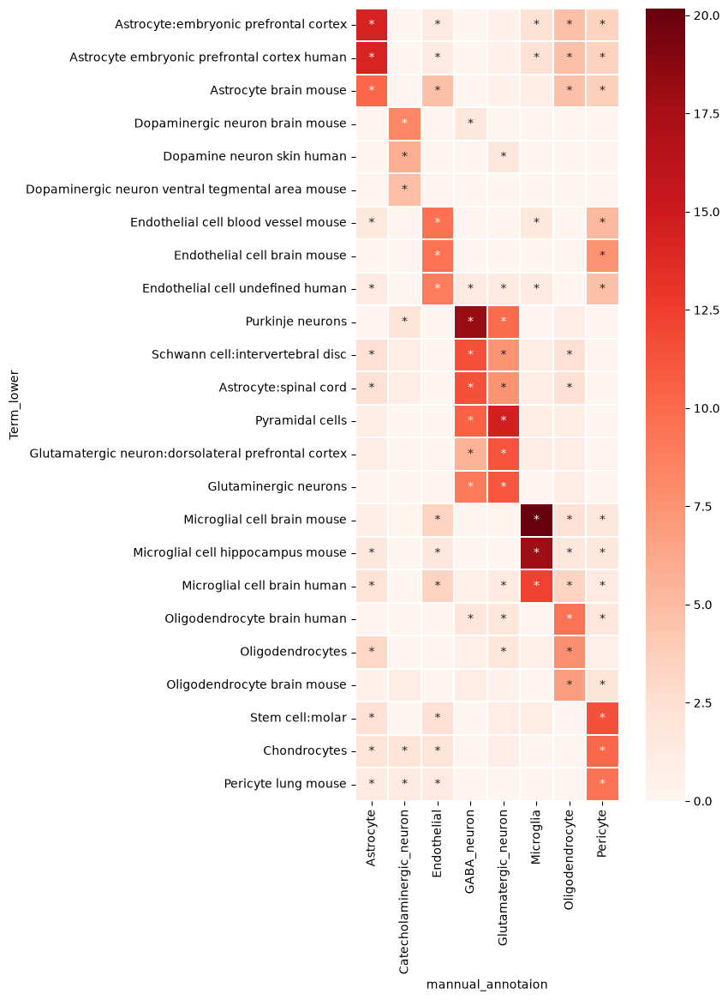

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = heatmap_with_groupwise_ordering(
    df= df,
    n=3,
    group_by='mannual_annotaion',
    order_by="P-value",
    cmap='Reds',
    xlabel_rotation=90,
    xlabel_fontsize=10,
    ylabel_fontsize=10,
    figsize=(8, 12),
    vmin=1, vmax=6,
    cbar_kws={'shrink': 1, 'label': '-log10(P-value)'},
    enable_column_order=False,
   # column_order=[
   #     "Contractile cardiomyocyte", 
   #     "Myogenerative cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ],
    enable_highlight_columns=False,
   # highlight_column_names=[
   #     "Contractile cardiomyocyte", 
   #     "Inflammatory cardiomyocyte"
   # ]
)

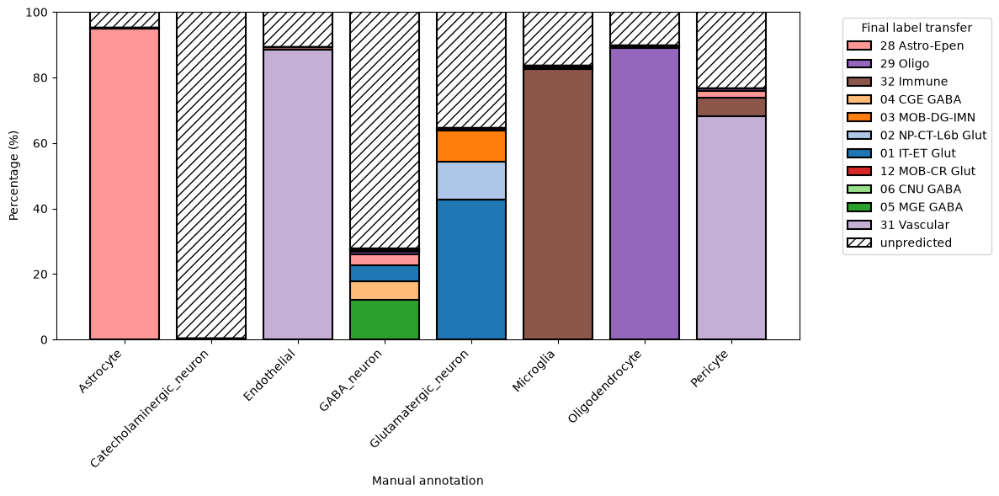

In [59]:
import pandas as pd
import matplotlib.pyplot as plt

ct = pd.crosstab(
    adata.obs['mannual_annotaion'],
    adata.obs['final_label_transfer'],
    normalize='index'
) * 100

labels = ct.columns.tolist()

colors = dict(zip(labels, plt.cm.tab20.colors))

fig, ax = plt.subplots(figsize=(12,6))

legend_labels = []

for i, idx in enumerate(ct.index):

    row = ct.loc[idx].sort_values(ascending=False)

    if 'unpredicted' in row.index:
        row = pd.concat([row.drop('unpredicted'), row[['unpredicted']]])

    bottom = 0

    for label, value in row.items():

        if label == 'unpredicted':
            ax.bar(
                i,
                value,
                bottom=bottom,
                color='none',
                edgecolor='black',
                hatch='///',
                linewidth=1.5,
                label=label if label not in legend_labels else None
            )

        else:
            ax.bar(
                i,
                value,
                bottom=bottom,
                color=colors[label],
                edgecolor='black',
                linewidth=1.5,
                label=label if label not in legend_labels else None
            )

        if label not in legend_labels:
            legend_labels.append(label)

        bottom += value


ax.set_xticks(range(len(ct.index)))
ax.set_xticklabels(ct.index, rotation=45, ha='right')

ax.set_ylabel("Percentage (%)")
ax.set_xlabel("Manual annotation")

ax.set_ylim(0,100)

ax.legend(
    title="Final label transfer",
    bbox_to_anchor=(1.05,1),
    loc="upper left"
)

plt.tight_layout()
plt.show()

# CCF annotation & Spatial Plot

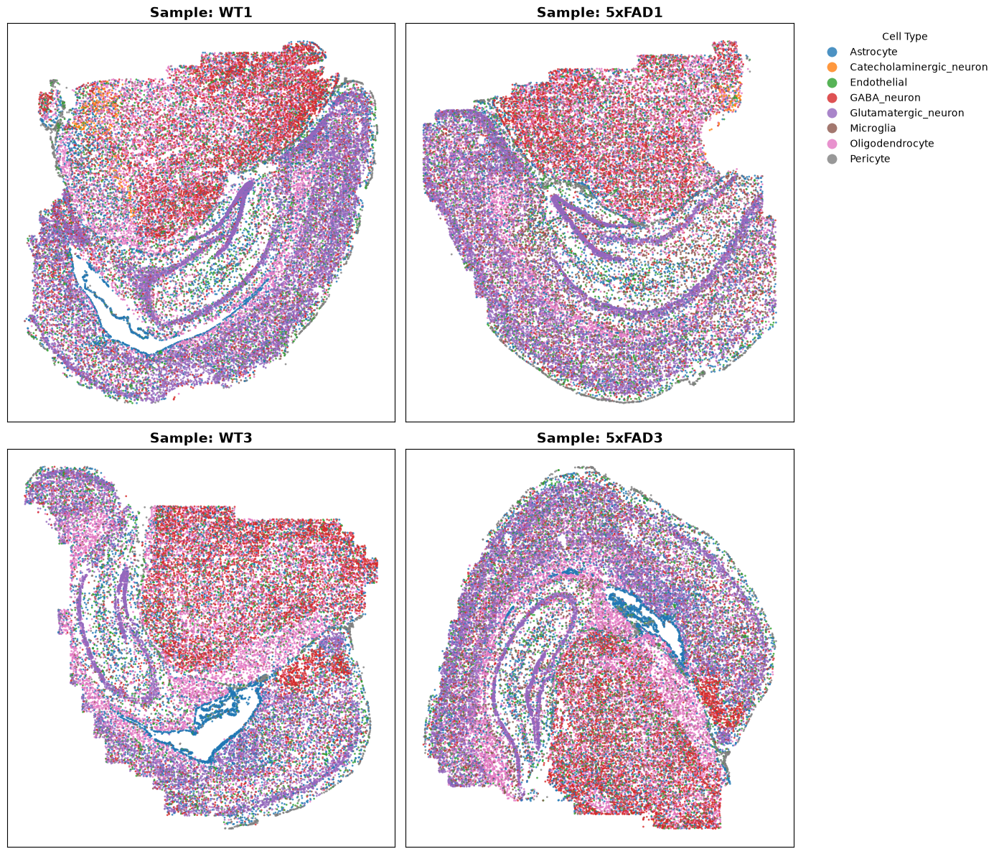

In [68]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["mannual_annotaion"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

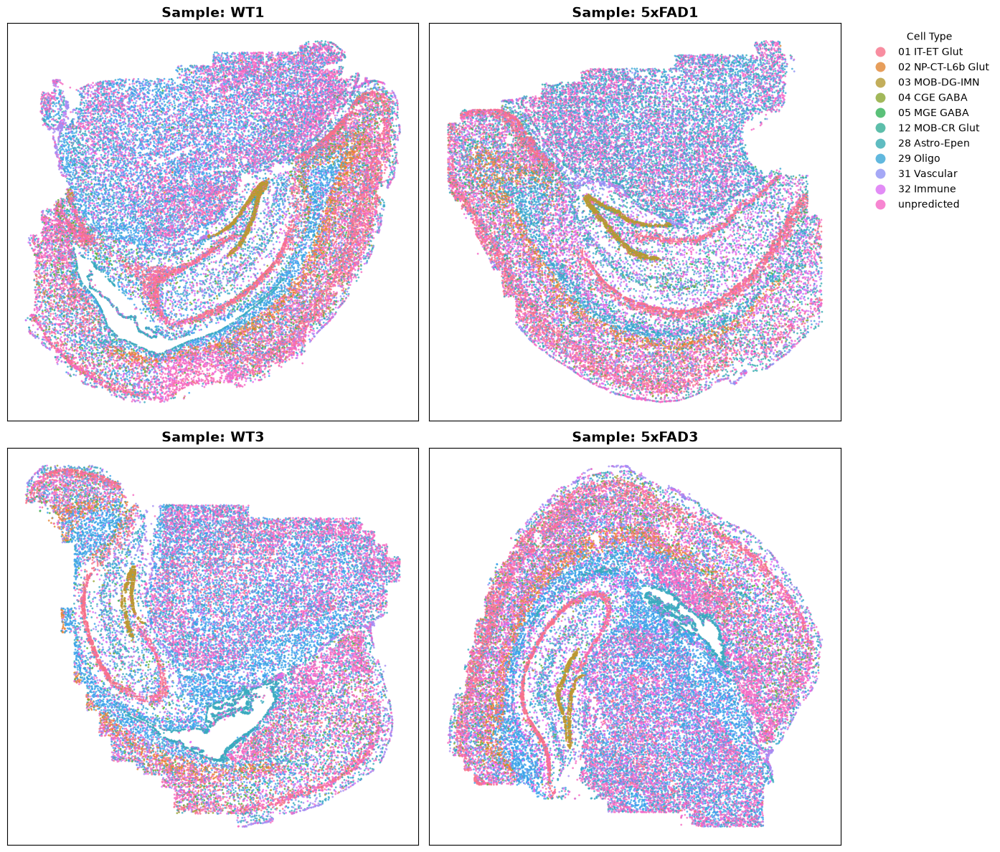

In [69]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["final_label_transfer"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Cell Type",
    )

plt.tight_layout()
plt.show()

In [ ]:
################# CCF annotaion ################

In [10]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_bulk_ccf_annotated.h5ad")

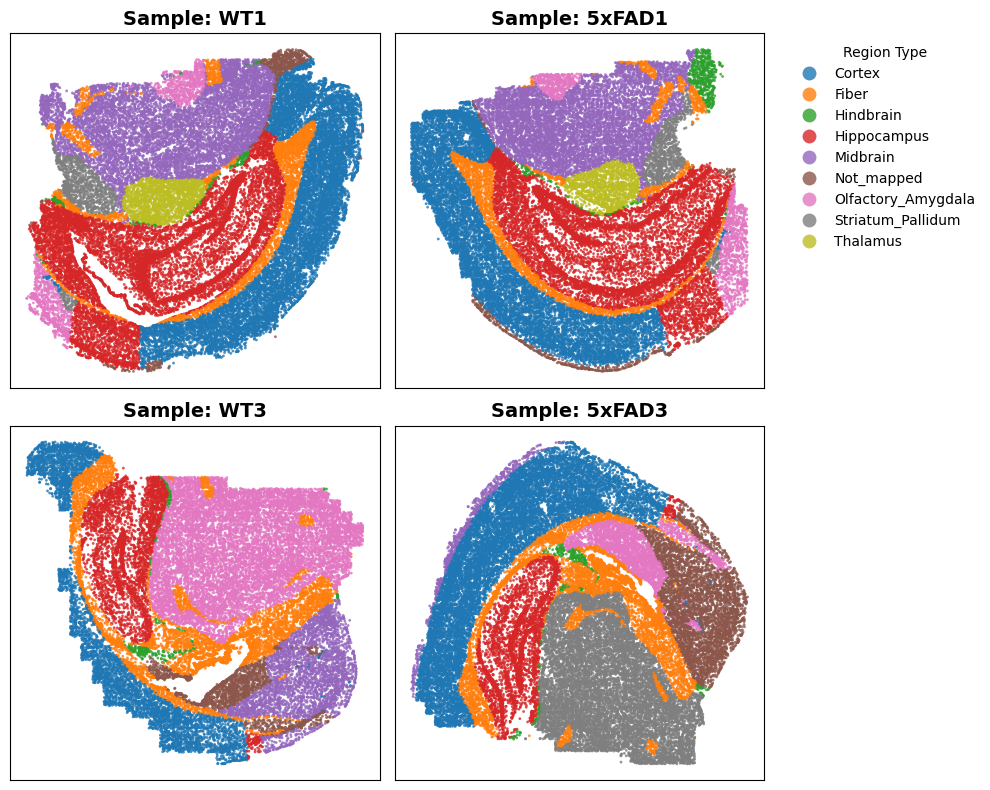

In [13]:
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns

samples = adata.obs["sample_id"].unique()[:4]

fig, axes = plt.subplots(2, 2, figsize=(10, 8), sharex=False, sharey=False)
axes = axes.flatten()

for i, sample_id in enumerate(samples):
    ax = axes[i]
    sub_adata = adata[adata.obs["sample_id"] == sample_id]

    x = sub_adata.obsm["spatial"][:, 0]
    y = sub_adata.obsm["spatial"][:, 1]
    cell_types = sub_adata.obs["CCF_major"]

    sns.scatterplot(
        x=x,
        y=y,
        hue=cell_types,
        ax=ax,
        s=4,
        linewidth=0,
        alpha=0.8,
        legend=(i == 1),
    )

    ax.set_title(f"Sample: {sample_id}", fontsize=14, fontweight="bold")
    ax.set_xlabel("")
    ax.set_ylabel("")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.invert_yaxis()

if axes[1].get_legend():
    axes[1].legend(
        bbox_to_anchor=(1.05, 1),
        loc="upper left",
        markerscale=5,
        frameon=False,
        title="Region Type",
    )

plt.tight_layout()
plt.show()

In [141]:
############ Cell type Population ##############

/tmp/ipykernel_1569871/817643145.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("CCF_major")["mannual_annotaion"]
/tmp/ipykernel_1569871/817643145.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("CCF_major")["mannual_annotaion"]


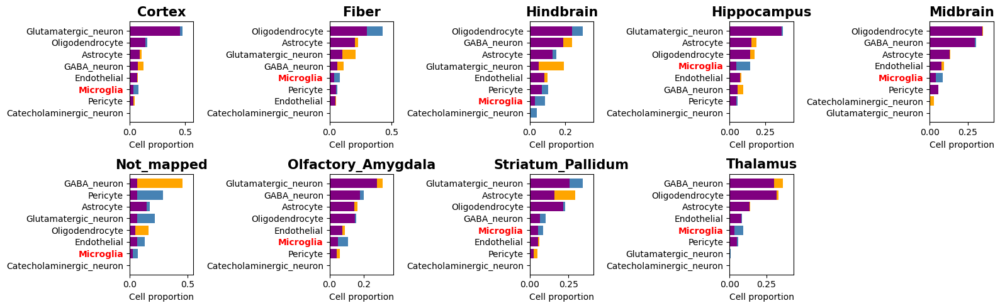

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

wt = adata[
    adata.obs["sample_id"].str.contains("WT")
].copy()

ad = adata[
    ~adata.obs["sample_id"].str.contains("WT")
].copy()

def get_prop(data):
    return (
        data.obs
        .groupby("CCF_major")["mannual_annotaion"]
        .value_counts(normalize=True)
        .unstack(fill_value=0)
    )

wt_prop = get_prop(wt)
ad_prop = get_prop(ad)

regions = sorted(
    set(wt_prop.index) | set(ad_prop.index)
)

fig, axes = plt.subplots(2, 5, figsize=(16, 5))
axes = axes.flatten()

for i, region in enumerate(regions):

    ax = axes[i]

    wt_values = wt_prop.loc[region] if region in wt_prop.index else pd.Series()
    ad_values = ad_prop.loc[region] if region in ad_prop.index else pd.Series()

    celltypes = sorted(
        set(wt_values.index) | set(ad_values.index)
    )

    wt_values = wt_values.reindex(celltypes, fill_value=0)
    ad_values = ad_values.reindex(celltypes, fill_value=0)

    order = (wt_values + ad_values).sort_values().index

    wt_values = wt_values.loc[order]
    ad_values = ad_values.loc[order]

    y = range(len(order))

    for j, ct in enumerate(order):

        wt = wt_values[ct]
        ad = ad_values[ct]

        overlap = min(wt, ad)

        if wt >= ad:
            ax.barh(
                j,
                overlap,
                color="purple"
            )
            ax.barh(
                j,
                wt - overlap,
                left=overlap,
                color="orange"
            )

        else:
            ax.barh(
                j,
                overlap,
                color="purple"
            )
            ax.barh(
                j,
                ad - overlap,
                left=overlap,
                color="steelblue"
            )

    ax.set_yticks(y)
    ax.set_yticklabels(order)

    for label in ax.get_yticklabels():
        if label.get_text() == "Microglia":
            label.set_color("red")
            label.set_fontweight("bold")

    ax.set_title(
        region,
        fontsize=15,
        fontweight="bold"
    )

    ax.set_xlabel(
        "Cell proportion"
    )

    ax.set_ylabel("")

    ax.set_xlim(
        0,
        max(
            wt_values.max(),
            ad_values.max()
        ) * 1.2
    )

for ax in axes[len(regions):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

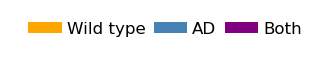

In [150]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

fig, ax = plt.subplots(figsize=(4, 0.5))

legend_elements = [
    Patch(facecolor="orange", label="Wild type"),
    Patch(facecolor="steelblue", label="AD"),
    Patch(facecolor="purple", label="Both")
]

ax.legend(
    handles=legend_elements,
    loc="center",
    frameon=False,
    fontsize=12,
    ncol=3,
    columnspacing=0.5,
    handletextpad=0.3
)

ax.axis("off")

plt.show()

In [4]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_bulk_ccf_annotated.h5ad")

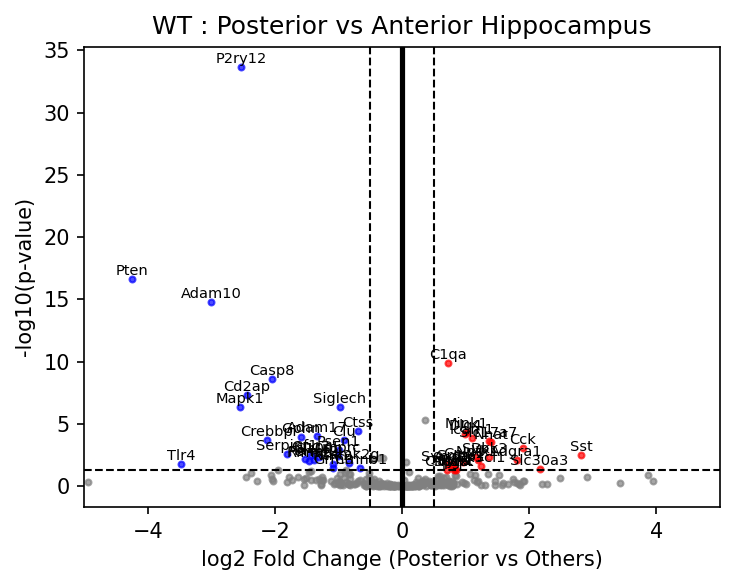

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc

adata_sub = adata[
    (adata.obs["genotype"] == "WT") &
    (adata.obs["CCF_major"] == "Hippocampus") &
    (adata.obs["mannual_annotaion"] == "Microglia")
].copy()

sc.tl.rank_genes_groups(
    adata_sub,
    groupby="region_location",
    groups=["Posterior Hippocampus"],
    reference="rest",
    method="wilcoxon"
)

deg = sc.get.rank_genes_groups_df(
    adata_sub,
    group="Posterior Hippocampus"
)

deg["-log10_pvalue"] = -np.log10(deg["pvals"])

deg["significance"] = "NS"

deg.loc[
    (deg["pvals"] < 0.05) &
    (deg["logfoldchanges"] > 0.5),
    "significance"
] = "Up"

deg.loc[
    (deg["pvals"] < 0.05) &
    (deg["logfoldchanges"] < -0.5),
    "significance"
] = "Down"


plot_df = deg[
    deg["logfoldchanges"].between(-5, 5)
].copy()


plt.figure(
    figsize=(5,4),
    dpi=150
)

colors = {
    "Up": "red",
    "Down": "blue",
    "NS": "gray"
}

for label in ["NS", "Down", "Up"]:
    df = plot_df[plot_df["significance"] == label]

    plt.scatter(
        df["logfoldchanges"],
        df["-log10_pvalue"],
        s=8,
        c=colors[label],
        alpha=0.7
    )

plt.axvline(
    0,
    color="black",
    linewidth=2.5
)

plt.axhline(
    -np.log10(0.05),
    linestyle="--",
    color="black",
    linewidth=1
)

plt.axvline(
    0.5,
    linestyle="--",
    color="black",
    linewidth=1
)

plt.axvline(
    -0.5,
    linestyle="--",
    color="black",
    linewidth=1
)

label_df = plot_df[
    (plot_df["pvals"] < 0.05) &
    (plot_df["logfoldchanges"].abs() >= 0.5)
]

for _, row in label_df.iterrows():
    plt.text(
        row["logfoldchanges"],
        row["-log10_pvalue"] + 0.08,
        row["names"],
        fontsize=7,
        ha="center",
        va="bottom"
    )

plt.xlabel("log2 Fold Change (Posterior vs Others)")
plt.ylabel("-log10(p-value)")
plt.title("WT : Posterior vs Anterior Hippocampus")

plt.xlim(-5, 5)

plt.tight_layout()
plt.show()

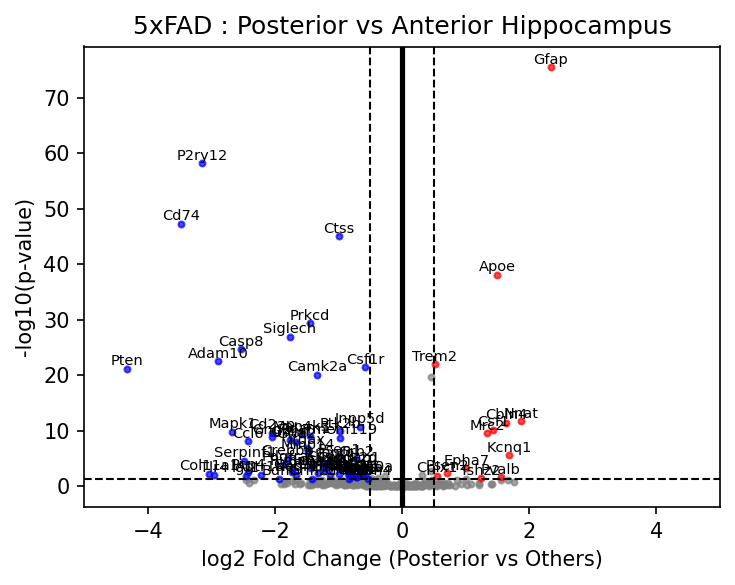

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc

adata_sub = adata[
    (adata.obs["genotype"] == "5xFAD") &
    (adata.obs["CCF_major"] == "Hippocampus") &
    (adata.obs["mannual_annotaion"] == "Microglia")
].copy()

sc.tl.rank_genes_groups(
    adata_sub,
    groupby="region_location",
    groups=["Posterior Hippocampus"],
    reference="rest",
    method="wilcoxon"
)

deg = sc.get.rank_genes_groups_df(
    adata_sub,
    group="Posterior Hippocampus"
)

deg["-log10_pvalue"] = -np.log10(deg["pvals"])

deg["significance"] = "NS"

deg.loc[
    (deg["pvals"] < 0.05) &
    (deg["logfoldchanges"] > 0.5),
    "significance"
] = "Up"

deg.loc[
    (deg["pvals"] < 0.05) &
    (deg["logfoldchanges"] < -0.5),
    "significance"
] = "Down"


plot_df = deg[
    deg["logfoldchanges"].between(-5, 5)
].copy()


plt.figure(
    figsize=(5,4),
    dpi=150
)

colors = {
    "Up": "red",
    "Down": "blue",
    "NS": "gray"
}

for label in ["NS", "Down", "Up"]:
    df = plot_df[plot_df["significance"] == label]

    plt.scatter(
        df["logfoldchanges"],
        df["-log10_pvalue"],
        s=8,
        c=colors[label],
        alpha=0.7
    )

plt.axvline(
    0,
    color="black",
    linewidth=2.5
)

plt.axhline(
    -np.log10(0.05),
    linestyle="--",
    color="black",
    linewidth=1
)

plt.axvline(
    0.5,
    linestyle="--",
    color="black",
    linewidth=1
)

plt.axvline(
    -0.5,
    linestyle="--",
    color="black",
    linewidth=1
)

label_df = plot_df[
    (plot_df["pvals"] < 0.05) &
    (plot_df["logfoldchanges"].abs() >= 0.5)
]

for _, row in label_df.iterrows():
    plt.text(
        row["logfoldchanges"],
        row["-log10_pvalue"] + 0.08,
        row["names"],
        fontsize=7,
        ha="center",
        va="bottom"
    )

plt.xlabel("log2 Fold Change (Posterior vs Others)")
plt.ylabel("-log10(p-value)")
plt.title("5xFAD : Posterior vs Anterior Hippocampus")

plt.xlim(-5, 5)

plt.tight_layout()
plt.show()

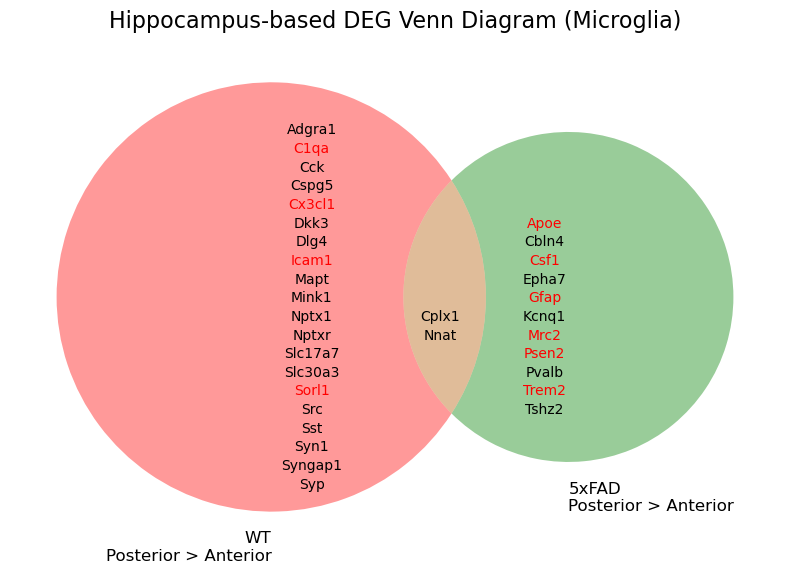

In [45]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

adata_sub = adata[
    (adata.obs["genotype"] == "WT") &
    (adata.obs["CCF_major"] == "Hippocampus") &
    (adata.obs["mannual_annotaion"] == "Microglia")
].copy()

sc.tl.rank_genes_groups(
    adata_sub,
    groupby="region_location",
    groups=["Posterior Hippocampus"],
    reference="rest",
    method="wilcoxon"
)

deg_wt = sc.get.rank_genes_groups_df(
    adata_sub,
    group="Posterior Hippocampus"
)


adata_sub = adata[
    (adata.obs["genotype"] == "5xFAD") &
    (adata.obs["CCF_major"] == "Hippocampus") &
    (adata.obs["mannual_annotaion"] == "Microglia")
].copy()

sc.tl.rank_genes_groups(
    adata_sub,
    groupby="region_location",
    groups=["Posterior Hippocampus"],
    reference="rest",
    method="wilcoxon"
)

deg_fad = sc.get.rank_genes_groups_df(
    adata_sub,
    group="Posterior Hippocampus"
)


deg_wt_up = set(
    deg_wt.loc[
        (deg_wt["pvals"] < 0.05) &
        (deg_wt["logfoldchanges"] > 0.5),
        "names"
    ]
)

deg_fad_up = set(
    deg_fad.loc[
        (deg_fad["pvals"] < 0.05) &
        (deg_fad["logfoldchanges"] > 0.5),
        "names"
    ]
)


wt_only = sorted(deg_wt_up - deg_fad_up)
fad_only = sorted(deg_fad_up - deg_wt_up)
shared = sorted(deg_wt_up & deg_fad_up)


plaque_genes = {
    "Apoe",
    "Trem2",
    "C1qa",
    "Csf1",
    "Gfap",
    "Icam1",
    "Psen2",
    "Sorl1",
    "Mrc2",
    "Cx3cl1"
}


plt.figure(figsize=(8, 8))

v = venn2(
    [deg_wt_up, deg_fad_up],
    set_labels=(
        "WT\nPosterior > Anterior",
        "5xFAD\nPosterior > Anterior"
    )
)


for idx, (region, genes) in enumerate(
    zip(
        ["10", "01", "11"],
        [wt_only, fad_only, shared]
    )
):

    if v.get_label_by_id(region):
        v.get_label_by_id(region).set_text("")


positions = {
    "10": (-0.35, 0),
    "01": (0.35, 0),
    "11": (0, 0)
}


def draw_gene_list(x, y, genes):
    spacing = 0.04
    
    for i, gene in enumerate(genes):
        color = "red" if gene in plaque_genes else "black"
        
        plt.text(
            x,
            y - i * spacing,
            gene,
            fontsize=10,
            ha="center",
            color=color
        )


draw_gene_list(
    -0.15,
    0.35,
    wt_only
)

draw_gene_list(
    0.35,
    0.15,
    fad_only
)

draw_gene_list(
    0.125,
    -0.05,
    shared
)


plt.title(
    "Hippocampus-based DEG Venn Diagram (Microglia)",
    fontsize=16
)

plt.tight_layout()
plt.show()

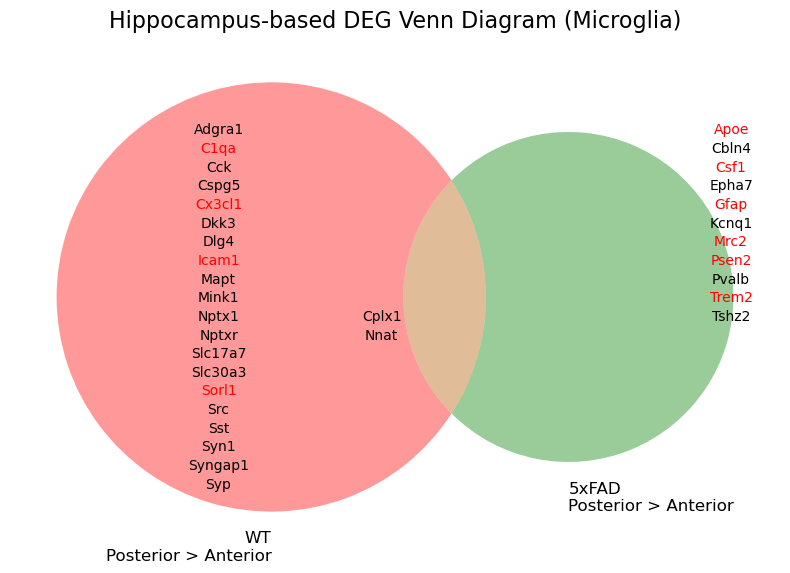

In [36]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

adata_sub = adata[
    (adata.obs["genotype"] == "WT") &
    (adata.obs["CCF_major"] == "Hippocampus") &
    (adata.obs["mannual_annotaion"] == "Microglia")
].copy()

sc.tl.rank_genes_groups(
    adata_sub,
    groupby="region_location",
    groups=["Posterior Hippocampus"],
    reference="rest",
    method="wilcoxon"
)

deg_wt = sc.get.rank_genes_groups_df(
    adata_sub,
    group="Posterior Hippocampus"
)


adata_sub = adata[
    (adata.obs["genotype"] == "5xFAD") &
    (adata.obs["CCF_major"] == "Hippocampus") &
    (adata.obs["mannual_annotaion"] == "Microglia")
].copy()

sc.tl.rank_genes_groups(
    adata_sub,
    groupby="region_location",
    groups=["Posterior Hippocampus"],
    reference="rest",
    method="wilcoxon"
)

deg_fad = sc.get.rank_genes_groups_df(
    adata_sub,
    group="Posterior Hippocampus"
)


deg_wt_up = set(
    deg_wt.loc[
        (deg_wt["pvals"] < 0.05) &
        (deg_wt["logfoldchanges"] > 0.5),
        "names"
    ]
)

deg_fad_up = set(
    deg_fad.loc[
        (deg_fad["pvals"] < 0.05) &
        (deg_fad["logfoldchanges"] > 0.5),
        "names"
    ]
)


wt_only = sorted(deg_wt_up - deg_fad_up)
fad_only = sorted(deg_fad_up - deg_wt_up)
shared = sorted(deg_wt_up & deg_fad_up)


plaque_genes = {
    "Apoe",
    "Trem2",
    "C1qa",
    "Csf1",
    "Gfap",
    "Icam1",
    "Psen2",
    "Sorl1",
    "Mrc2",
    "Cx3cl1"
}


plt.figure(figsize=(8, 8))

v = venn2(
    [deg_wt_up, deg_fad_up],
    set_labels=(
        "WT\nPosterior > Anterior",
        "5xFAD\nPosterior > Anterior"
    )
)


for idx, (region, genes) in enumerate(
    zip(
        ["10", "01", "11"],
        [wt_only, fad_only, shared]
    )
):

    if v.get_label_by_id(region):
        v.get_label_by_id(region).set_text("")


positions = {
    "10": (-0.35, 0),
    "01": (0.35, 0),
    "11": (0, 0)
}


def draw_gene_list(x, y, genes):
    spacing = 0.04
    
    for i, gene in enumerate(genes):
        color = "red" if gene in plaque_genes else "black"
        
        plt.text(
            x,
            y - i * spacing,
            gene,
            fontsize=10,
            ha="center",
            color=color
        )


draw_gene_list(
    -0.35,
    0.35,
    wt_only
)

draw_gene_list(
    0.75,
    0.35,
    fad_only
)

draw_gene_list(
    0,
    -0.05,
    shared
)


plt.title(
    "Hippocampus-based DEG Venn Diagram (Microglia)",
    fontsize=16
)

plt.tight_layout()
plt.show()

In [23]:
print("WT Posterior > Anterior only")
print(wt_only)

print("\n5xFAD Posterior > Anterior only")
print(fad_only)

print("\nShared genes")
print(shared)

WT Posterior > Anterior only
['Adgra1', 'C1qa', 'Cck', 'Cspg5', 'Cx3cl1', 'Dkk3', 'Dlg4', 'Icam1', 'Mapt', 'Mink1', 'Nptx1', 'Nptxr', 'Slc17a7', 'Slc30a3', 'Sorl1', 'Src', 'Sst', 'Syn1', 'Syngap1', 'Syp']

5xFAD Posterior > Anterior only
['Apoe', 'Cbln4', 'Csf1', 'Epha7', 'Gfap', 'Kcnq1', 'Mrc2', 'Psen2', 'Pvalb', 'Trem2', 'Tshz2']

Shared genes
['Cplx1', 'Nnat']


# Plaque calculate

In [55]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_label_transfer_manual.h5ad")

In [56]:
import scanpy as sc

pdata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/Plaques_Object.h5ad")

In [57]:
import os
import pandas as pd

data_info = [
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_0.h5ad",
        "sample_id": "WT1",
        "genotype": "WT",
        "strain": "C57BL6",
        "sex": "Female",
        "age": "12.0 months",
        "region_location": "Posterior Hippocampus",
        "region_short": "pHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/WT-5xFAD10518pHip300GP/region_1.h5ad",
        "sample_id": "5xFAD1",
        "genotype": "5xFAD",
        "strain": "5xFAD (C57BL6 background)",
        "sex": "Female",
        "age": "12.0 months",
        "region_location": "Posterior Hippocampus",
        "region_short": "pHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_1.h5ad",
        "sample_id": "WT3",
        "genotype": "WT",
        "strain": "C57BL6",
        "sex": "Male",
        "age": "12.0 months",
        "region_location": "Anterior Hippocampus",
        "region_short": "AnteHip",
        "trem2_mutation": False
    },
    {
        "path": "/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/5xFAD-TREM2-AnteHip-300x05/region_3.h5ad",
        "sample_id": "5xFAD3",
        "genotype": "5xFAD",
        "strain": "5xFAD (C57BL6 background)",
        "sex": "Male",
        "age": "12.0 months",
        "region_location": "Anterior Hippocampus",
        "region_short": "AnteHip",
        "trem2_mutation": False
    }]

data_info_df = pd.DataFrame(data_info)

def make_key(path):
    path = path.replace("\\", "/")
    
    if "WT-5xFAD10518pHip300GP" in path:
        sample = "WT-5xFAD10518pHip300GP"
    elif "5xFAD-TREM2-AnteHip-300x05" in path:
        sample = "5xFAD-TREM2-AnteHip-300x05"
    else:
        return None
    
    region = path.split("region_")[1].split(".")[0].split("/")[0]
    
    return f"{sample}_region_{region}"


data_info_df["key"] = data_info_df["path"].apply(make_key)

pdata.obs["key"] = pdata.obs["sample"].apply(make_key)

sample_id_map = dict(
    zip(
        data_info_df["key"],
        data_info_df["sample_id"]
    )
)

pdata.obs["sample_id"] = pdata.obs["key"].map(sample_id_map)

pdata = pdata[pdata.obs["sample_id"].notna()].copy()

In [58]:
pdata.obsm["spatial"] = pdata.obsm["spatial"][:, [1,0]]

pdata.obs["imagecol"], pdata.obs["imagerow"] = (
    pdata.obs["imagerow"].copy(),
    pdata.obs["imagecol"].copy())

In [59]:
print(pdata)
print(adata)

AnnData object with n_obs × n_vars = 1235 × 300
    obs: 'sample', 'imagecol', 'imagerow', 'fov', 'volume', 'cell_cov', 'batch', 'counts', 'ratio', 'coarse_gen', 'coarse_batch', 'region_labels', 'gen', 'plaque_1', 'region_labels_coarse', 'gen_old', 'key', 'sample_id'
    var: 'mean', 'std'
    uns: 'gen_colors', 'region_labels_colors', 'spatial'
    obsm: 'spatial'
    layers: 'Log_Normalized_Counts', 'Normalized_Counts'
AnnData object with n_obs × n_vars = 136456 × 300
    obs: 'fov', 'center_x', 'center_y', 'x_min', 'x_max', 'y_min', 'y_max', 'volume', 'sample_id', 'genotype', 'strain', 'sex', 'age', 'region_location', 'region_short', 'trem2_mutation', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_300_genes', '_scvi_batch', '_scvi_labels

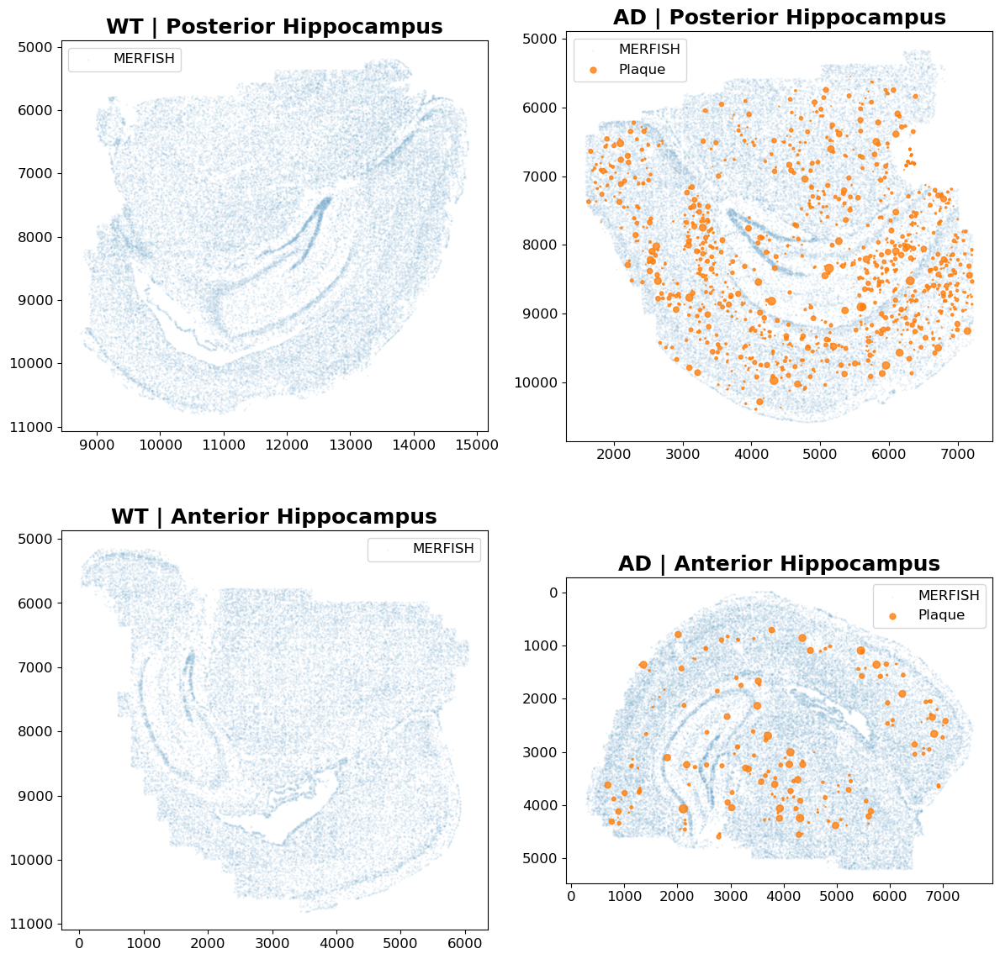

In [62]:
import matplotlib.pyplot as plt
import numpy as np

sample_info = {
    x["sample_id"]: x for x in data_info
}

sample_ids = [
    "WT1",
    "5xFAD1",
    "WT3",
    "5xFAD3"
]

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for ax, sid in zip(axes, sample_ids):

    ad = adata[adata.obs["sample_id"] == sid]
    pd = pdata[pdata.obs["sample_id"] == sid]

    info = sample_info[sid]

    disease = "WT" if info["genotype"] == "WT" else "AD"
    region = info["region_location"]

    ax.scatter(
        ad.obs["center_x"],
        ad.obs["center_y"],
        s=1,
        alpha=0.05,
        label="MERFISH"
    )

    if pd.n_obs > 0:

        volume = pd.obs["volume"].values

        if volume.max() != volume.min():
            size = (
                (volume - volume.min()) /
                (volume.max() - volume.min())
            ) * 50
        else:
            size = np.ones_like(volume) * 20

        ax.scatter(
            pd.obsm["spatial"][:, 0],
            pd.obsm["spatial"][:, 1],
            s=size,
            alpha=0.8,
            label="Plaque"
        )

    ax.set_title(
        f"{disease} | {region}",
        fontsize=18,
        fontweight="bold"
    )

    ax.tick_params(
        labelsize=12
    )

    ax.invert_yaxis()
    ax.set_aspect("equal")

    ax.legend(
        fontsize=12
    )

plt.tight_layout()
plt.show()

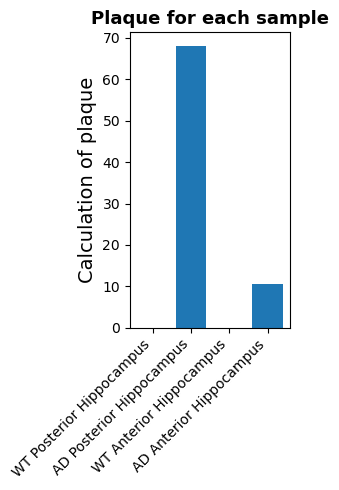

In [80]:
import matplotlib.pyplot as plt

plot_df = burden_df.copy()

plot_df["status"] = plot_df["genotype"].replace(
    {
        "5xFAD": "AD",
        "WT": "WT"
    }
)

plot_df["group"] = (
    plot_df["status"]
    + " "
    + plot_df["region_location"]
)

plt.figure(figsize=(3,5))

plt.bar(
    plot_df["group"],
    plot_df["plaque_volume_per_cell"]
)

plt.xticks(
    rotation=45,
    ha="right",
    fontsize=10,

)

plt.ylabel(
    "Calculation of plaque",
    fontsize=14
)

plt.xlabel(
    "",
    fontsize=14
)

plt.title(
    "Plaque for each sample",    fontweight="bold",
    fontsize=13
)

plt.tight_layout()
plt.show()

In [82]:
adata.obs

,fov,center_x,center_y,x_min,x_max,y_min,y_max,volume,sample_id,genotype,...,cluster_score,final_label_transfer,leiden_res_0.50,leiden_res_0.75,leiden_res_1.00,leiden_res_1.25,leiden_res_0.10,leiden_res_0.25,Mannual_annotaion,mannual_annotaion
WT1_cell_in_reg_0_2_Z_0_fov_4_1254955,4.0,8775.994551,9489.482154,8773.942551,8778.046551,9488.240154,9490.724154,7.645752,WT1,WT,...,1.000000,28 Astro-Epen,0,0,0,0,0,0,Astrocyte,Astrocyte
WT1_cell_in_reg_0_3_Z_0_fov_4_3395225,4.0,8746.564551,9521.612154,8744.350551,8748.778551,9519.344154,9523.880154,15.064056,WT1,WT,...,0.951385,29 Oligo,1,1,1,1,1,1,OPC,Oligodendrocyte
WT1_cell_in_reg_0_4_Z_0_fov_4_8963533,4.0,8746.834551,9525.932154,8744.458551,8749.210551,9523.340154,9528.524154,18.475776,WT1,WT,...,1.000000,32 Immune,2,2,2,2,2,2,Microglia,Microglia
WT1_cell_in_reg_0_6_Z_0_fov_5_2675372,5.0,8981.193719,9618.001006,8976.981719,8985.405719,9614.275006,9621.727006,115.963488,WT1,WT,...,0.549649,01 IT-ET Glut,3,3,3,3,3,3,Glutamatergic_neuron,Glutamatergic_neuron
WT1_cell_in_reg_0_7_Z_0_fov_5_7937334,5.0,8987.241719,9624.805006,8983.245719,8989.833719,9620.755006,9631.447006,332.336520,WT1,WT,...,0.803690,31 Vascular,4,4,4,4,4,4,Endothelial,Endothelial
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5xFAD3_cell_in_reg_0_28_Z_0_fov_1908_2795782,1908.0,7552.841932,2578.416383,7548.467932,7557.215932,2573.556383,2581.980383,212.777604,5xFAD3,5xFAD,...,0.550078,31 Vascular,8,8,8,9,4,6,Pericyte,Pericyte
5xFAD3_cell_in_reg_0_29_Z_0_fov_1908_1258497,1908.0,7503.809932,2587.812383,7499.219932,7507.643932,2582.196383,2592.348383,687.872736,5xFAD3,5xFAD,...,0.900162,29 Oligo,9,9,9,11,6,7,Oligodendrocyte,Oligodendrocyte
5xFAD3_cell_in_reg_0_30_Z_0_fov_1908_5444959,1908.0,7548.467932,2593.536383,7541.123932,7555.379932,2585.436383,2599.692383,1539.455544,5xFAD3,5xFAD,...,0.704318,unpredicted,8,8,8,20,0,6,Pericyte,Pericyte
5xFAD3_cell_in_reg_0_2_Z_0_fov_1909_3644925,1909.0,7461.581932,2313.439618,7455.155932,7466.603932,2307.553618,2321.485618,1243.090800,5xFAD3,5xFAD,...,0.397164,unpredicted,4,4,4,4,4,4,Endothelial,Endothelial


In [21]:
### VAE simulation ###

In [22]:
adata.obs['mannual_annotaion'].unique()

['Astrocyte', 'Oligodendrocyte', 'Microglia', 'Glutamatergic_neuron', 'Endothelial', 'GABA_neuron', 'Pericyte', 'Catecholaminergic_neuron']
Categories (8, object): ['Astrocyte', 'Catecholaminergic_neuron', 'Endothelial', 'GABA_neuron', 'Glutamatergic_neuron', 'Microglia', 'Oligodendrocyte', 'Pericyte']

In [23]:
import numpy as np
import pandas as pd

from scipy import sparse

from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score, mean_squared_error

import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader


device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

print(device)



############################################
# Plaque score
############################################

adata.obs["plaque_score_decay"] = 0.0


for sid in adata.obs["sample_id"].unique():

    cell_mask = adata.obs["sample_id"] == sid
    plaque_mask = pdata.obs["sample_id"] == sid


    cell_xy = adata.obs.loc[
        cell_mask,
        ["center_x","center_y"]
    ].values


    plaque_xy = pdata.obsm["spatial"][plaque_mask]


    volumes = pdata.obs.loc[
        plaque_mask,
        "volume"
    ].values


    if len(plaque_xy)==0:
        continue


    nn_model = NearestNeighbors(
        n_neighbors=len(plaque_xy)
    )


    nn_model.fit(
        plaque_xy
    )


    dist,index = nn_model.kneighbors(
        cell_xy
    )


    score = np.sum(
        volumes[index] /
        (dist+1)**2,
        axis=1
    )


    adata.obs.loc[
        cell_mask,
        "plaque_score_decay"
    ] = score



adata.obs["plaque_score_decay"] = np.log1p(
    adata.obs["plaque_score_decay"]
)



adata.obs["plaque_score_decay"] = (
    adata.obs
    .groupby("sample_id")
    ["plaque_score_decay"]
    .transform(
        lambda x:
        (x-x.mean())/(x.std()+1e-8)
    )
)




############################################
# Dataset
############################################

class SpatialDataset(torch.utils.data.Dataset):

    def __init__(
        self,
        X,
        y,
        batch
    ):

        self.X=torch.tensor(
            X,
            dtype=torch.float32
        )

        self.y=torch.tensor(
            y,
            dtype=torch.float32
        )

        self.batch=torch.tensor(
            batch,
            dtype=torch.long
        )


    def __len__(self):
        return len(self.X)


    def __getitem__(self,i):

        return (
            self.X[i],
            self.y[i],
            self.batch[i]
        )





############################################
# VAE
############################################

class VAE(nn.Module):

    def __init__(
        self,
        n_gene,
        n_batch,
        latent=16
    ):

        super().__init__()


        self.encoder=nn.Sequential(
            nn.Linear(n_gene,512),
            nn.ReLU(),
            nn.Linear(512,128),
            nn.ReLU()
        )


        self.mu=nn.Linear(
            128,
            latent
        )


        self.logvar=nn.Linear(
            128,
            latent
        )


        self.batch_emb=nn.Embedding(
            n_batch,
            8
        )


        self.decoder=nn.Sequential(
            nn.Linear(latent+8,128),
            nn.ReLU(),
            nn.Linear(128,512),
            nn.ReLU(),
            nn.Linear(512,n_gene)
        )


        self.plaque_head=nn.Sequential(
            nn.Linear(latent,32),
            nn.ReLU(),
            nn.Linear(32,1)
        )



    def encode(self,x):

        h=self.encoder(x)

        return (
            self.mu(h),
            self.logvar(h)
        )


    def sample(self,mu,logvar):

        std=torch.exp(
            0.5*logvar
        )

        eps=torch.randn_like(std)

        return mu+eps*std



    def forward(
        self,
        x,
        batch
    ):

        mu,logvar=self.encode(x)

        z=self.sample(
            mu,
            logvar
        )


        b=self.batch_emb(batch)


        recon=self.decoder(
            torch.cat(
                [z,b],
                dim=1
            )
        )


        plaque_pred=self.plaque_head(
            z
        )


        return (
            recon,
            plaque_pred.squeeze(),
            mu,
            logvar
        )




############################################
# Cell type별 training function
############################################

def train_celltype(
    celltype,
    epochs=150
):


    print("\n================")
    print(celltype)
    print("================")


    sub = adata[
        (adata.obs["mannual_annotaion"]==celltype)
        &
        (~adata.obs["sample_id"].isin(
            ["WT1","WT3"]
        ))
    ].copy()



    if sub.n_obs < 100:
        return None



    X=sub.X


    if sparse.issparse(X):
        X=X.toarray()


    X=np.log1p(X)


    scaler=StandardScaler()

    X=scaler.fit_transform(
        X
    )


    y=sub.obs[
        "plaque_score_decay"
    ].values



    batch_cat=pd.Categorical(
        sub.obs["sample_id"]
    )


    batch=batch_cat.codes



    dataset=SpatialDataset(
        X,
        y,
        batch
    )


    loader=DataLoader(
        dataset,
        batch_size=128,
        shuffle=True
    )



    model=VAE(
        X.shape[1],
        len(batch_cat.categories)
    ).to(device)



    optimizer=torch.optim.Adam(
        model.parameters(),
        lr=1e-4
    )



    for epoch in range(epochs):

        total=0


        for x,yb,b in loader:

            x=x.to(device)
            yb=yb.to(device)
            b=b.to(device)



            recon,pred,mu,logvar=model(
                x,
                b
            )


            recon_loss=nn.functional.mse_loss(
                recon,
                x
            )


            plaque_loss=nn.functional.mse_loss(
                pred,
                yb
            )


            kl=-0.5*torch.mean(
                1+logvar-mu.pow(2)-logvar.exp()
            )


            loss=(
                recon_loss
                +
                plaque_loss
                +
                kl*0.001
            )


            optimizer.zero_grad()

            loss.backward()

            optimizer.step()


            total+=loss.item()



        if epoch%50==0:
            print(
                epoch,
                total/len(loader)
            )




    model.eval()


    with torch.no_grad():

        Z=model.encode(
            torch.tensor(
                X,
                dtype=torch.float32
            ).to(device)
        )[0]


    Z=Z.cpu().numpy()



    Z_train,Z_test,y_train,y_test=train_test_split(
        Z,
        y,
        test_size=0.2,
        random_state=42
    )



    ridge=Ridge(
        alpha=1
    )


    ridge.fit(
        Z_train,
        y_train
    )


    pred=ridge.predict(
        Z_test
    )



    result=pd.DataFrame(
        {
            "celltype":celltype,
            "latent_dim":np.arange(16),
            "coefficient":ridge.coef_
        }
    )


    result["abs_coefficient"] = (
        result.coefficient.abs()
    )


    print(
        "R2:",
        r2_score(
            y_test,
            pred
        )
    )


    return {
        "model":model,
        "latent":Z,
        "ridge":result,
        "scaler":scaler,
        "adata":sub
    }




############################################
# Run all cell types
############################################

models={}


for ct in adata.obs["mannual_annotaion"].unique():

    result=train_celltype(
        ct
    )

    if result is not None:
        models[ct]=result



############################################
# Combine ridge results
############################################

latent_results=pd.concat(
    [
        models[x]["ridge"]
        for x in models
    ],
    ignore_index=True
)


latent_results.sort_values(
    "abs_coefficient",
    ascending=False
)

cuda


/tmp/ipykernel_288124/2495458827.py:95: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("sample_id")



Astrocyte
0 1.844097038632945


KeyboardInterrupt: 

In [61]:
import os, torch, joblib, numpy as np

save_dir="/home/Data_Drive_8TB_2/kykim/potrai/VAE_model/"
os.makedirs(save_dir,exist_ok=True)

for ct,r in models.items():

    d=os.path.join(save_dir,ct.replace(" ","_").replace("/","_"))
    os.makedirs(d,exist_ok=True)

    m=r["model"]

    torch.save({
        "model_state_dict":m.state_dict(),
        "n_gene":m.encoder[0].in_features,
        "latent_dim":m.mu.out_features,
        "n_batch":m.batch_emb.num_embeddings
    },os.path.join(d,"vae_model.pt"))

    np.save(os.path.join(d,"latent.npy"),r["latent"])
    r["ridge"].to_csv(os.path.join(d,"ridge_coefficient.csv"),index=False)
    joblib.dump(r["scaler"],os.path.join(d,"scaler.pkl"))
    r["adata"].write_h5ad(os.path.join(d,"subset.h5ad"))

In [154]:
checkpoint = torch.load(
    "/home/Data_Drive_8TB_2/kykim/potrai/VAE_model/Microglia/vae_model.pt",
    map_location=device)


model = VAE(
    n_gene=checkpoint["n_gene"],
    n_batch=checkpoint["n_batch"],
    latent=checkpoint["latent_dim"]).to(device)


model.load_state_dict(checkpoint["model_state_dict"])
model.eval()
scaler = joblib.load("/home/Data_Drive_8TB_2/kykim/potrai/VAE_model/Microglia/scaler.pkl")

latent = np.load("/home/Data_Drive_8TB_2/kykim/potrai/VAE_model/Microglia/latent.npy")

In [159]:
import numpy as np
import pandas as pd
import joblib


ct = "Microglia"

save_path = "/home/Data_Drive_8TB_2/kykim/potrai/VAE_model/Microglia"


latent = np.load(
    os.path.join(save_path,"latent.npy"))


ridge = pd.read_csv(
    os.path.join(save_path,"ridge_coefficient.csv"))

In [1]:
import glob
import os
import pandas as pd


all_results = []


base="/home/Data_Drive_8TB_2/kykim/potrai/VAE_model"


for ct_dir in glob.glob(os.path.join(base,"*")):

    if not os.path.isdir(ct_dir):
        continue

    ct=os.path.basename(ct_dir)

    ridge_file=os.path.join(
        ct_dir,
        "ridge_coefficient.csv"
    )

    if os.path.exists(ridge_file):

        df=pd.read_csv(ridge_file)

        df["celltype"]=ct

        all_results.append(df)


latent_results=pd.concat(
    all_results,
    ignore_index=True
)


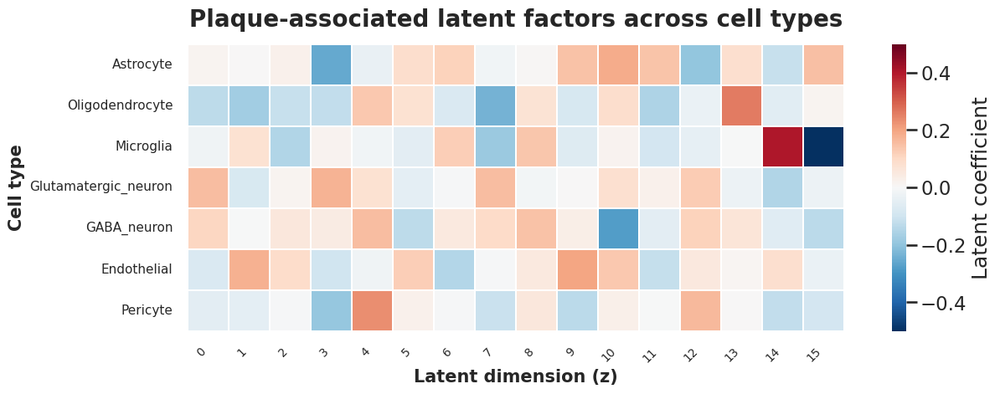

In [158]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


heatmap_data = (
    latent_results
    .pivot(
        index="celltype",
        columns="latent_dim",
        values="coefficient"
    )
)


cell_order = [
    "Astrocyte",
    "Oligodendrocyte",
    "Microglia",
    "Glutamatergic_neuron",
    "GABA_neuron",
    "Endothelial",
    "Pericyte"
]


heatmap_data = heatmap_data.loc[
    [x for x in cell_order if x in heatmap_data.index]
]


plt.figure(
    figsize=(14,5)
)


ax = sns.heatmap(
    heatmap_data,
    cmap="RdBu_r",
    center=0,
    linewidths=0.3,
    linecolor="white",
    square=True,
    cbar_kws={
        "label":"Latent coefficient"
    },
    vmin=-0.5,
    vmax=0.5
)


ax.set_xlabel(
    "Latent dimension (z)",
    fontsize=15,
    fontweight="bold"
)

ax.set_ylabel(
    "Cell type",
    fontsize=15,
    fontweight="bold"
)


ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    ha="right",
    fontsize=10
)


ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=0,
    fontsize=11,
)


plt.title(
    "Plaque-associated latent factors across cell types",
    fontsize=20,
    fontweight="bold",
    pad=15
)


plt.tight_layout()

plt.show()

In [164]:
import os
import numpy as np
import pandas as pd
import torch
import scanpy as sc


model_path="/home/Data_Drive_8TB_2/kykim/potrai/VAE_model/Microglia"


checkpoint=torch.load(
    os.path.join(model_path,"vae_model.pt"),
    map_location=device
)


micro_model=VAE(
    n_gene=checkpoint["n_gene"],
    n_batch=checkpoint["n_batch"],
    latent=checkpoint["latent_dim"]
).to(device)


micro_model.load_state_dict(
    checkpoint["model_state_dict"]
)


micro_model.eval()


micro_Z=np.load(
    os.path.join(model_path,"latent.npy")
)


micro_sub=sc.read_h5ad(
    os.path.join(model_path,"subset.h5ad")
)



latent_dim=15


z_base=np.zeros(
    (1,checkpoint["latent_dim"])
)


z_low=z_base.copy()
z_high=z_base.copy()


z_low[0,latent_dim]=-3
z_high[0,latent_dim]=3



batch_id=torch.tensor(
    [0],
    dtype=torch.long
).to(device)



with torch.no_grad():

    z_low_tensor=torch.tensor(
        z_low,
        dtype=torch.float32
    ).to(device)


    z_high_tensor=torch.tensor(
        z_high,
        dtype=torch.float32
    ).to(device)


    batch_emb=micro_model.batch_emb(
        batch_id
    )


    gene_low=micro_model.decoder(
        torch.cat(
            [
                z_low_tensor,
                batch_emb
            ],
            dim=1
        )
    )


    gene_high=micro_model.decoder(
        torch.cat(
            [
                z_high_tensor,
                batch_emb
            ],
            dim=1
        )
    )



gene_diff=(
    gene_high.cpu().numpy()[0]
    -
    gene_low.cpu().numpy()[0]
)



gene_result_latent15=pd.DataFrame(
    {
        "gene":micro_sub.var_names,
        "latent15_effect":gene_diff
    }
)


gene_result_latent15["abs_effect"]=(
    gene_result_latent15["latent15_effect"]
    .abs()
)


gene_result_latent15=gene_result_latent15.sort_values(
    "latent15_effect",
    ascending=False)

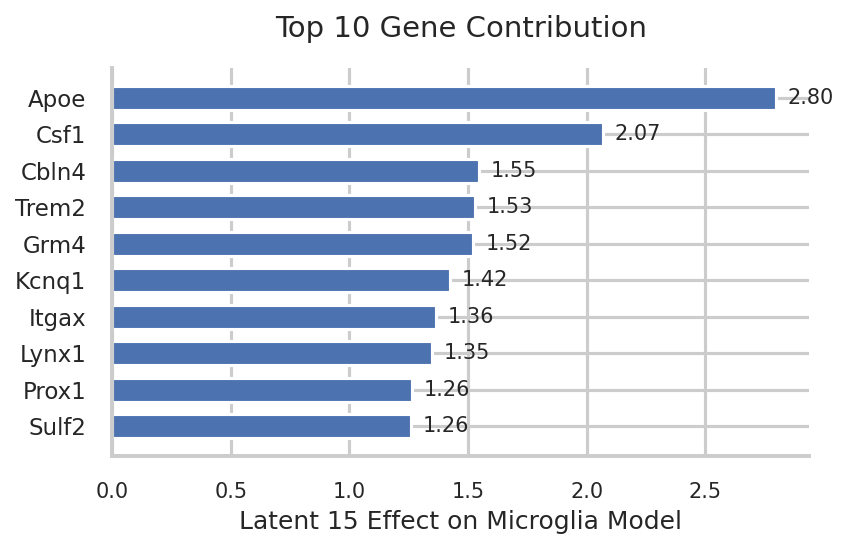

In [165]:
import matplotlib.pyplot as plt
import numpy as np


plot_df = (
    gene_result_latent15
    .sort_values(
        "latent15_effect",
        ascending=False
    )
    .head(10)
    .sort_values(
        "latent15_effect"
    )
)


plt.figure(
    figsize=(6,4),
    dpi=150
)


bars = plt.barh(
    plot_df["gene"],
    plot_df["latent15_effect"],
    height=0.65
)


plt.axvline(
    0,
    linewidth=1
)


for bar, value in zip(
    bars,
    plot_df["latent15_effect"]
):

    plt.text(
        value + 0.05,
        bar.get_y() + bar.get_height()/2,
        f"{value:.2f}",
        va="center",
        fontsize=10
    )


plt.xlabel(
    "Latent 15 Effect on Microglia Model",
    fontsize=12
)

plt.ylabel(
    "",
    fontsize=12
)


plt.title(
    "Top 10 Gene Contribution",
    fontsize=14,
    pad=15
)


plt.xticks(
    fontsize=10
)

plt.yticks(
    fontsize=11
)


plt.gca().spines["top"].set_visible(False)
plt.gca().spines["right"].set_visible(False)


plt.tight_layout()

plt.show()

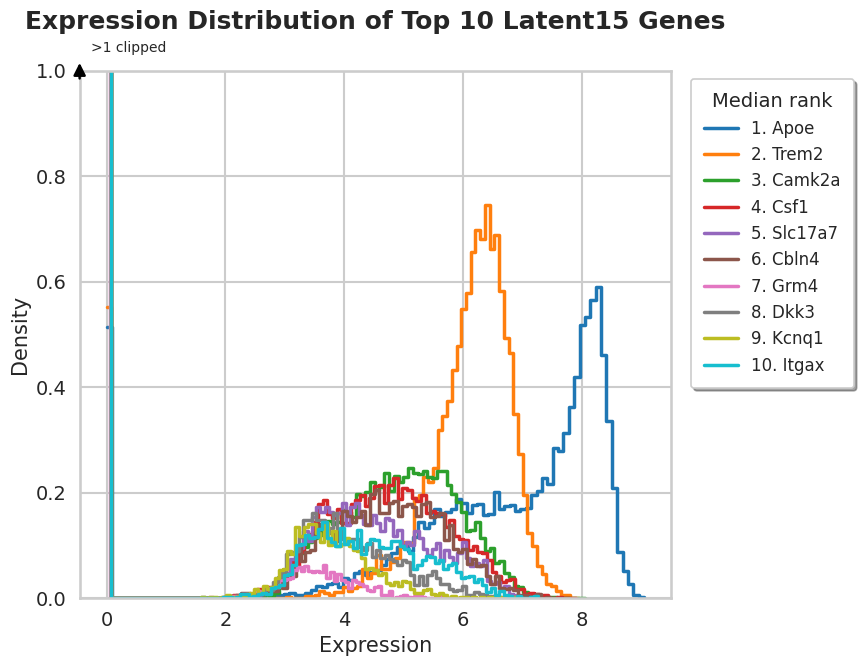

In [166]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import sparse

sns.set_theme(
    style="whitegrid",
    context="talk"
)

genes = (
    gene_result_latent15
    .sort_values("abs_effect", ascending=False)
    .head(10)["gene"]
    .tolist()
)

micro = adata[
    adata.obs["mannual_annotaion"] == "Microglia"
].copy()

X = micro.X

if sparse.issparse(X):
    X = X.toarray()

expr = pd.DataFrame(
    X,
    index=micro.obs_names,
    columns=micro.var_names
)

median_rank = (
    expr[genes]
    .median()
    .sort_values(ascending=False)
)

genes = median_rank.index.tolist()

palette = sns.color_palette("tab10", len(genes))

fig, ax = plt.subplots(figsize=(9,7))

for i, g in enumerate(genes):

    sns.histplot(
        expr[g],
        bins=100,
        stat="density",
        element="step",
        fill=False,
        linewidth=2.5,
        color=palette[i],
        label=f"{i+1}. {g}",
        ax=ax
    )

ax.set_ylim(0,1)

ax.annotate(
    "",
    xy=(0,1.02),
    xytext=(0,0.98),
    xycoords=("axes fraction","axes fraction"),
    arrowprops=dict(
        arrowstyle="-|>",
        lw=1.8,
        color="black"
    )
)

ax.text(
    0.02,
    1.035,
    ">1 clipped",
    transform=ax.transAxes,
    fontsize=10,
)

ax.set_xlabel(
    "Expression",
    fontsize=15)

ax.set_ylabel(
    "Density",
    fontsize=15)

ax.set_title(
    "Expression Distribution of Top 10 Latent15 Genes",
    fontsize=18,
    fontweight="bold",
    pad=30
)

ax.tick_params(
    axis="both",
    labelsize=14,
    width=1.5,
    length=6
)

legend = ax.legend(
    title="Median rank",
    title_fontsize=14,
    fontsize=12,
    loc="upper left",
    bbox_to_anchor=(1.02,1),
    frameon=True,
    fancybox=True,
    shadow=True,
    borderpad=0.8
)

legend.get_frame().set_linewidth(1.2)

plt.tight_layout()
plt.show()

In [31]:
################# Position compare #################

In [47]:
import scanpy as sc

adata = sc.read_h5ad("/home/Data_Drive_8TB_2/kykim/potrai/MERSCOPE/after_bulk_ccf_annotated.h5ad")

/tmp/ipykernel_1569871/2268166565.py:49: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  .replace({"5xFAD": "AD"})


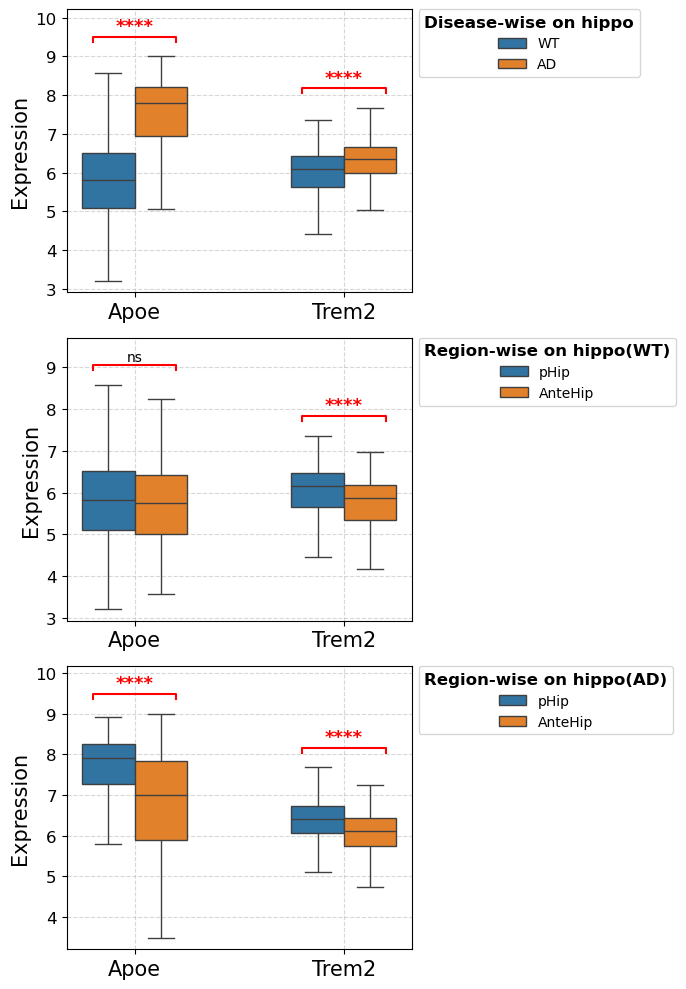

In [48]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import sparse
from statannotations.Annotator import Annotator

adata = adata[adata.obs['CCF_major'] == 'Hippocampus'].copy()

genes = ["Apoe", "Trem2"]

group_width = 0.5

fig_width = 7
fig_height = 10

ylabel = "Expression"

xlabel_size = 15
ylabel_size = 15
xtick_size = 15
ytick_size = 12

star_size = 13

legend_fontsize = 10
legend_title_size = 12
legend_loc = "upper left"
legend_anchor = (1.02, 1)

micro = adata[
    adata.obs["mannual_annotaion"] == "Microglia"
].copy()

X = micro.X

if sparse.issparse(X):
    X = X.toarray()

expr = pd.DataFrame(
    X,
    index=micro.obs_names,
    columns=micro.var_names
)

plot_df = expr[genes].copy()

plot_df["genotype"] = (
    micro.obs["genotype"]
    .replace({"5xFAD": "AD"})
    .values
)

plot_df["region"] = micro.obs["region_short"].values

plot_df = plot_df.melt(
    id_vars=["genotype", "region"],
    var_name="gene",
    value_name="expression"
)

fig, axes = plt.subplots(
    3, 1, figsize=(fig_width, fig_height)
)

ax1 = axes[0]

sns.boxplot(
    data=plot_df,
    x="gene",
    y="expression",
    hue="genotype",
    hue_order=["WT", "AD"],
    width=group_width,
    showfliers=False,
    ax=ax1
)

pairs = [
    ((g, "WT"), (g, "AD"))
    for g in genes
]

annot1 = Annotator(
    ax1,
    pairs,
    data=plot_df,
    x="gene",
    y="expression",
    hue="genotype",
    order=genes,
    hue_order=["WT", "AD"]
)

annot1.configure(
    test="Mann-Whitney",
    text_format="star",
    loc="inside",
    color="red",
    verbose=0
)

annot1.apply_and_annotate()

for text in ax1.texts:
    if "*" in text.get_text():
        text.set_color("red")
        text.set_fontweight("bold")
        text.set_fontsize(star_size)

legend1 = ax1.legend(
    title="Disease-wise on hippo",
    loc=legend_loc,
    bbox_to_anchor=legend_anchor,
    borderaxespad=0,
    frameon=True,
    fontsize=legend_fontsize,
    title_fontsize=legend_title_size
)
legend1.get_title().set_fontweight("bold")

ax2 = axes[1]

plot_df_wt = plot_df[plot_df["genotype"] == "WT"].copy()

sns.boxplot(
    data=plot_df_wt,
    x="gene",
    y="expression",
    hue="region",
    hue_order=["pHip", "AnteHip"],
    width=group_width,
    showfliers=False,
    ax=ax2
)

pairs = [
    ((g, "pHip"), (g, "AnteHip"))
    for g in genes
]

annot2 = Annotator(
    ax2,
    pairs,
    data=plot_df_wt,
    x="gene",
    y="expression",
    hue="region",
    order=genes,
    hue_order=["pHip", "AnteHip"]
)

annot2.configure(
    test="Mann-Whitney",
    text_format="star",
    loc="inside",
    color="red",
    verbose=0
)

annot2.apply_and_annotate()

for text in ax2.texts:
    if "*" in text.get_text():
        text.set_color("red")
        text.set_fontweight("bold")
        text.set_fontsize(star_size)

legend2 = ax2.legend(
    title="Region-wise on hippo(WT)",
    loc=legend_loc,
    bbox_to_anchor=legend_anchor,
    borderaxespad=0,
    frameon=True,
    fontsize=legend_fontsize,
    title_fontsize=legend_title_size
)
legend2.get_title().set_fontweight("bold")

ax3 = axes[2]

plot_df_ad = plot_df[plot_df["genotype"] == "AD"].copy()

sns.boxplot(
    data=plot_df_ad,
    x="gene",
    y="expression",
    hue="region",
    hue_order=["pHip", "AnteHip"],
    width=group_width,
    showfliers=False,
    ax=ax3
)

annot3 = Annotator(
    ax3,
    pairs,
    data=plot_df_ad,
    x="gene",
    y="expression",
    hue="region",
    order=genes,
    hue_order=["pHip", "AnteHip"]
)

annot3.configure(
    test="Mann-Whitney",
    text_format="star",
    loc="inside",
    color="red",
    verbose=0
)

annot3.apply_and_annotate()

for text in ax3.texts:
    if "*" in text.get_text():
        text.set_color("red")
        text.set_fontweight("bold")
        text.set_fontsize(star_size)

legend3 = ax3.legend(
    title="Region-wise on hippo(AD)",
    loc=legend_loc,
    bbox_to_anchor=legend_anchor,
    borderaxespad=0,
    frameon=True,
    fontsize=legend_fontsize,
    title_fontsize=legend_title_size
)
legend3.get_title().set_fontweight("bold")

all_axes = [ax1, ax2, ax3]

for ax in all_axes:
    ax.set_title("")
    ax.set_xlabel("")
    ax.set_ylabel(
        ylabel,
        fontsize=ylabel_size)
    ax.tick_params(
        axis="x",
        labelsize=xtick_size
    )
    ax.tick_params(
        axis="y",
        labelsize=ytick_size
    )
    ax.grid(True, linestyle="--", alpha=0.5, zorder=0)
    ax.set_axisbelow(True)

plt.tight_layout()
plt.show()

# fGSEA (z15 pathway)

In [24]:
import os
import torch
import numpy as np
import scanpy as sc
import joblib


device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)


model_path = "/home/Data_Drive_8TB_2/kykim/potrai/VAE_model/Microglia"


checkpoint = torch.load(
    os.path.join(model_path, "vae_model.pt"),
    map_location=device
)


model = VAE(
    n_gene=checkpoint["n_gene"],
    n_batch=checkpoint["n_batch"],
    latent=checkpoint["latent_dim"]
).to(device)


model.load_state_dict(
    checkpoint["model_state_dict"]
)


model.eval()


latent = np.load(
    os.path.join(model_path, "latent.npy")
)


adata = sc.read_h5ad(
    os.path.join(model_path, "subset.h5ad")
)


scaler = joblib.load(
    os.path.join(model_path, "scaler.pkl")
)


print(latent.shape)
print(adata.shape)

(7004, 16)
(7004, 300)


In [39]:
latent_top20_list = []

for z in microglia_latent_gene_effect["latent_dim"].unique():

    top20 = (
        microglia_latent_gene_effect[
            microglia_latent_gene_effect["latent_dim"] == z
        ]
        .sort_values(
            "effect",
            ascending=False
        )
        .head(100)
        .copy()
    )

    latent_top20_list.append(top20)


latent_top20_df = pd.concat(
    latent_top20_list,
    ignore_index=True
)


latent_top20_df

,gene,latent_dim,effect,abs_effect
0,Rorb,z0,1.270708,1.270708
1,Grm4,z0,1.173250,1.173250
2,Grm1,z0,1.027739,1.027739
3,Slc17a6,z0,0.965325,0.965325
4,Cacng5,z0,0.921638,0.921638
...,...,...,...,...
1595,Aqp4,z15,0.342676,0.342676
1596,Il1b,z15,0.339588,0.339588
1597,Hrh3,z15,0.329825,0.329825
1598,S100b,z15,0.329094,0.329094


In [40]:
file_path = "/home/Data_Drive_8TB_2/kykim/potrai/VAE_model/latent_top100_df.csv"

latent_top20_df.to_csv(file_path, index=False, encoding="utf-8-sig")

# Cell Cell interaction

/tmp/ipykernel_288124/3673180081.py:105: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,0,0.95])
/tmp/ipykernel_288124/3673180081.py:105: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0,0,0,0.95])


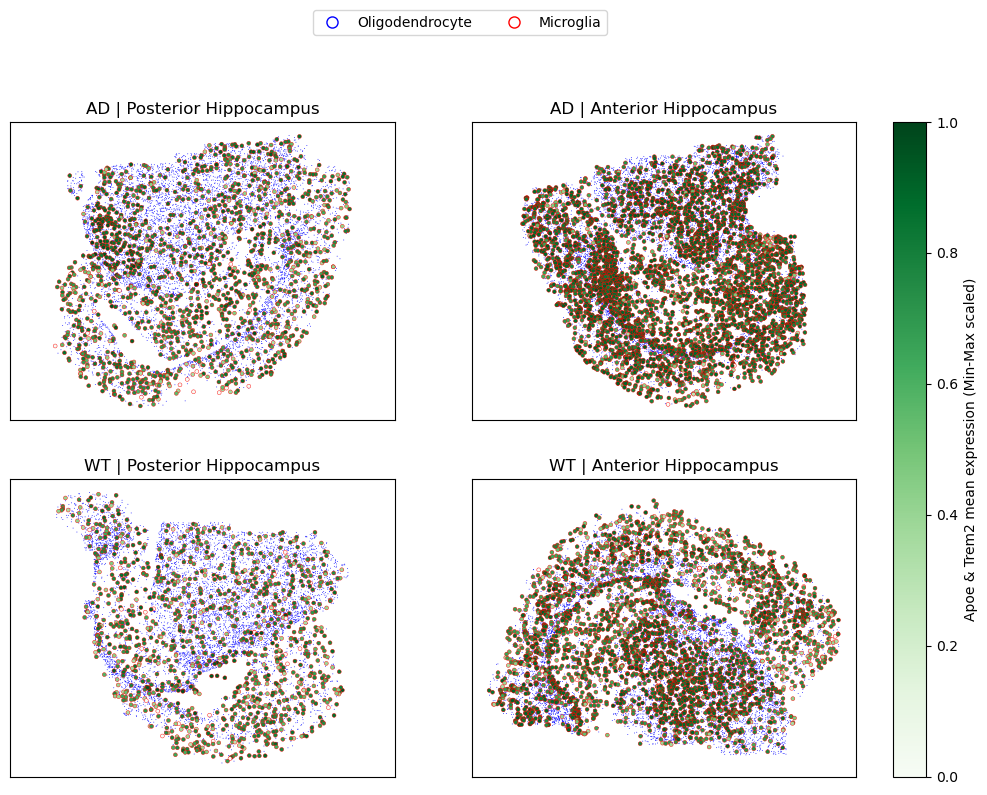

In [125]:
import matplotlib.pyplot as plt
import numpy as np

adata_sub = adata[adata.obs["mannual_annotaion"].isin(["Microglia","Oligodendrocyte"])].copy()

samples = adata_sub.obs["sample_id"].unique()

sample_title = {
    samples[0]: "AD | Posterior Hippocampus",
    samples[1]: "AD | Anterior Hippocampus",
    samples[2]: "WT | Posterior Hippocampus",
    samples[3]: "WT | Anterior Hippocampus"
}

apoe_idx = adata_sub.var_names.get_loc("Apoe")
trem2_idx = adata_sub.var_names.get_loc("Trem2")

fig, axes = plt.subplots(2, 2, figsize=(12,8.5))
axes = axes.flatten()

for ax, s in zip(axes, samples):
    tmp = adata_sub[adata_sub.obs["sample_id"] == s]
    
    xy = tmp.obsm["spatial"]
    
    micro = tmp.obs["mannual_annotaion"] == "Microglia"
    oligo = tmp.obs["mannual_annotaion"] == "Oligodendrocyte"
    
    ax.scatter(
        xy[oligo,0],
        xy[oligo,1],
        s=0.1,
        facecolors="none",
        edgecolors="blue",
        linewidths=0.3
    )
    
    apoe = tmp[micro].X[:, apoe_idx]
    trem2 = tmp[micro].X[:, trem2_idx]
    
    if hasattr(apoe, "toarray"):
        apoe = apoe.toarray().flatten()
        trem2 = trem2.toarray().flatten()
    else:
        apoe = np.array(apoe).flatten()
        trem2 = np.array(trem2).flatten()
    
    expr = (apoe + trem2) / 2
    expr = (expr - expr.min()) / (expr.max() - expr.min())
    
    sc = ax.scatter(
        xy[micro,0],
        xy[micro,1],
        s=8,
        c=expr,
        cmap="Greens",
        edgecolors="red",
        linewidths=0.3
    )
    
    ax.set_title(sample_title[s], fontsize=12)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.axis("equal")
    ax.invert_yaxis()

fig.colorbar(
    sc,
    ax=axes,
    fraction=0.05,
    pad=0.04,
    label="Apoe & Trem2 mean expression (Min-Max scaled)"
)

handles = [
    plt.Line2D(
        [],
        [],
        marker='o',
        linestyle='none',
        markerfacecolor='none',
        markeredgecolor='blue',
        markersize=8,
        label='Oligodendrocyte'
    ),
    plt.Line2D(
        [],
        [],
        marker='o',
        linestyle='none',
        markerfacecolor='none',
        markeredgecolor='red',
        markersize=8,
        label='Microglia'
    )
]

fig.legend(
    handles=handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.02),
    ncol=2
)

plt.tight_layout(rect=[0,0,0,0.95])
plt.show()

/tmp/ipykernel_288124/3036647528.py:121: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0,0,0,0.95])
/tmp/ipykernel_288124/3036647528.py:121: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0,0,0,0.95])


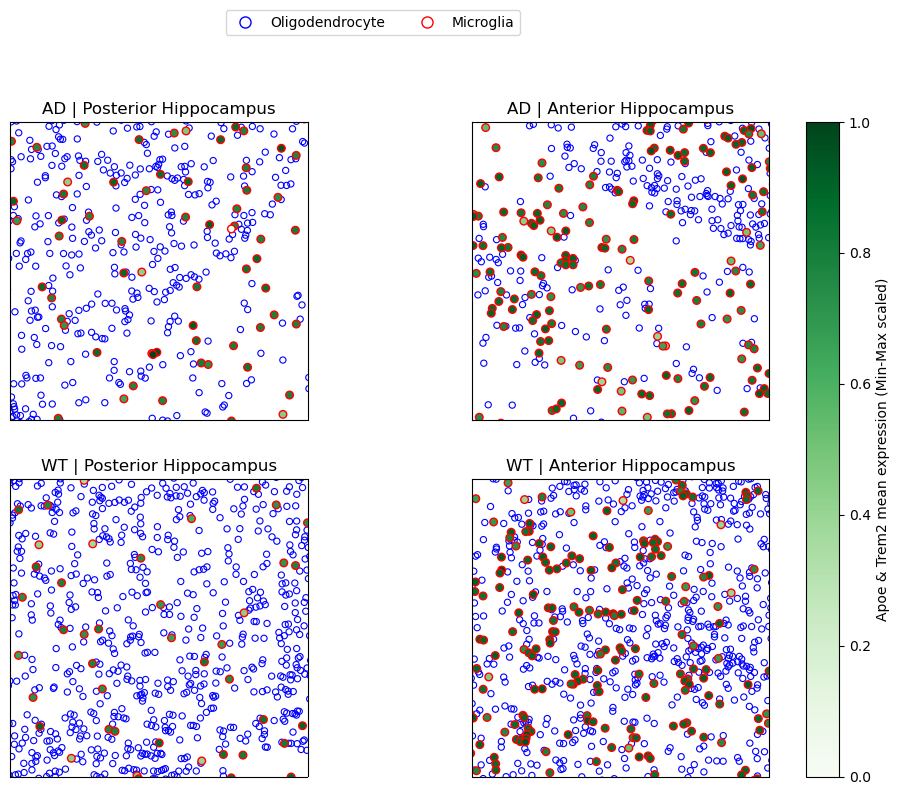

In [136]:
import matplotlib.pyplot as plt
import numpy as np

adata_sub = adata[adata.obs["mannual_annotaion"].isin(["Microglia","Oligodendrocyte"])].copy()

samples = adata_sub.obs["sample_id"].unique()

sample_title = {
    samples[0]: "AD | Posterior Hippocampus",
    samples[1]: "AD | Anterior Hippocampus",
    samples[2]: "WT | Posterior Hippocampus",
    samples[3]: "WT | Anterior Hippocampus"
}

apoe_idx = adata_sub.var_names.get_loc("Apoe")
trem2_idx = adata_sub.var_names.get_loc("Trem2")

fig, axes = plt.subplots(2, 2, figsize=(12,8.5))
axes = axes.flatten()

for ax, s in zip(axes, samples):
    tmp = adata_sub[adata_sub.obs["sample_id"] == s]
    
    xy = tmp.obsm["spatial"]
    
    micro = tmp.obs["mannual_annotaion"] == "Microglia"
    oligo = tmp.obs["mannual_annotaion"] == "Oligodendrocyte"
    
    ax.scatter(
        xy[oligo,0],
        xy[oligo,1],
        s=20,
        facecolors="none",
        edgecolors="blue",
        linewidths=0.8
    )
    
    apoe = tmp[micro].X[:, apoe_idx]
    trem2 = tmp[micro].X[:, trem2_idx]
    
    if hasattr(apoe, "toarray"):
        apoe = apoe.toarray().flatten()
        trem2 = trem2.toarray().flatten()
    else:
        apoe = np.array(apoe).flatten()
        trem2 = np.array(trem2).flatten()
    
    expr = (apoe + trem2) / 2
    expr = (expr - expr.min()) / (expr.max() - expr.min())
    
    sc = ax.scatter(
        xy[micro,0],
        xy[micro,1],
        s=30,
        c=expr,
        cmap="Greens",
        edgecolors="red",
        linewidths=1
    )
    
    micro_xy = xy[micro]

    x_center = np.mean(micro_xy[:,0])
    y_center = np.mean(micro_xy[:,1])

    roi_size = 500

    ax.set_xlim(
        x_center - roi_size,
        x_center + roi_size
    )

    ax.set_ylim(
        y_center + roi_size,
        y_center - roi_size
    )

    ax.set_title(sample_title[s], fontsize=12)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("equal")

fig.colorbar(
    sc,
    ax=axes,
    fraction=0.05,
    pad=0.04,
    label="Apoe & Trem2 mean expression (Min-Max scaled)"
)

handles = [
    plt.Line2D(
        [],
        [],
        marker='o',
        linestyle='none',
        markerfacecolor='none',
        markeredgecolor='blue',
        markersize=8,
        label='Oligodendrocyte'
    ),
    plt.Line2D(
        [],
        [],
        marker='o',
        linestyle='none',
        markerfacecolor='none',
        markeredgecolor='red',
        markersize=8,
        label='Microglia'
    )
]

fig.legend(
    handles=handles,
    loc="upper center",
    bbox_to_anchor=(0.5, 1.02),
    ncol=2
)

plt.tight_layout(rect=[0,0,0,0.95])
plt.show()